In [ ]:
!pip install pyGRNN
from sklearn.model_selection import KFold
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

def evaluate_grnn(X, y, n_steps_in, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    mae_scores = []
    mape_scores = []
    r2_scores = []
    bias_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred = grnn.predict(X_test_flattened)

        mae = np.mean(np.abs(y_test - y_pred))
        mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
        r2 = r2_score(y_test, y_pred)
        bias = np.mean(y_pred - y_test)

        mae_scores.append(mae)
        mape_scores.append(mape)
        r2_scores.append(r2)
        bias_scores.append(bias)

        # Visualisasi Actual vs. Prediksi
        # plt.figure(figsize=(10, 6))
        # plt.plot(y_test, label='Actual', marker='o')
        # plt.plot(y_pred, label='Predicted', marker='x')
        # plt.title('Actual vs. Predicted Values')
        # plt.xlabel('Data Point')
        # plt.ylabel('Value')
        # plt.legend()
        # plt.show()

    mae_mean = np.mean(mae_scores)
    mae_std = np.std(mae_scores)
    mape_mean = np.mean(mape_scores)
    mape_std = np.std(mape_scores)
    r2_mean = np.mean(r2_scores)
    r2_std = np.std(r2_scores)
    bias_mean = np.mean(bias_scores)
    bias_std = np.std(bias_scores)

    return mae_mean, mae_std, mape_mean, mape_std, r2_mean, r2_std, bias_mean, bias_std

# Mengubah dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Time step options for each dataset
time_steps_options = {
    'Yen': 1,
    'Yuan': 3,
    'Dollar': 5,
    'Yen' : 7,
    'Yuan' : 9,
    'Dollar' : 11
}

datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values
    n_steps_in = time_steps_options[name]
    n_steps_out = 1
    X, y = create_sequences(data, n_steps_in, n_steps_out)
    mae_mean, mae_std, mape_mean, mape_std, r2_mean, r2_std, bias_mean, bias_std = evaluate_grnn(X, y, n_steps_in, n_splits=5)
    results.append({
        'Dataset': name,
        'Time Step': n_steps_in,
        'MAE Mean': mae_mean,
        'MAE Std': mae_std,
        'MAPE Mean': mape_mean,
        'MAPE Std': mape_std,
        'R2 Mean': r2_mean,
        'R2 Std': r2_std,
        'Bias Mean': bias_mean,
        'Bias Std': bias_std
    })

# Menampilkan hasil percobaan
results_df = pd.DataFrame(results)
print(results_df)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Executing warm start...
Warm start concluded. The optimum isotropic sigma is [0.0254456]
Gradient search concluded. The optimum sigma is [0.04315151 0.01993376 0.02373687 0.01143594 0.02669115 0.03360385
 0.01147361 0.04324981 0.02573589 0.02137685 0.01047833 0.03041748
 0.04377554 0.01052169 0.0604409  0.02734031 0.01062697 0.05837331
 0.02027304 0.00839674 0.01524497]
Executing warm start...


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Warm start concluded. The optimum isotropic sigma is [0.02450241]
Gradient search concluded. The optimum sigma is [0.13718617 0.06756821 0.05979214 0.05611946 0.07368317 0.04916881
 0.04954103 0.05988141 0.17803681 0.01990362 0.02886576 0.05613936
 0.09809431 0.03109596 0.17362798 0.11326665 0.09390098 0.12810312
 0.02334485 0.02553234 0.01093352]
Executing warm start...


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Warm start concluded. The optimum isotropic sigma is [0.02286157]


KeyboardInterrupt: 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_test, y_pred, dataset_name, n_steps):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9,11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)  # Tambahkan argumen n_steps_out=1
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred = grnn.predict(X_test_flattened)

        # Menghitung Mean Squared Error (MSE)
        mse = mean_squared_error(y_test, y_pred)

        # Menyimpan hasil untuk timestep saat ini
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'MSE': mse
        })

        # Visualisasi actual vs predicted
        plot_actual_vs_predicted(y_test, y_pred, name, n_steps)

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MSE terendah sebagai nilai optimal
optimal_timestep = results_df.loc[results_df['MSE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


In [ ]:
!pip install pyGRNN
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_test, y_pred, dataset_name, n_steps):
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)  # Tambahkan argumen n_steps_out=1
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred = grnn.predict(X_test_flattened)

        # Menghitung Mean Absolute Error (MAE), R-square, dan Bias
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        bias = np.mean(y_pred - y_test)

        # Menyimpan hasil untuk timestep saat ini
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'MAE': mae,
            'R-square': r2,
            'Bias': bias
        })

        # Visualisasi actual vs predicted
        plot_actual_vs_predicted(y_test, y_pred, name, n_steps)

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal
optimal_timestep = results_df.loc[results_df['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


In [ ]:
!pip install pyGRNN
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred_train = grnn.predict(X_train_flattened)
        y_pred_test = grnn.predict(X_test_flattened)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


In [ ]:
!pip install pyGRNN
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred_train = grnn.predict(X_train_flattened)
        y_pred_test = grnn.predict(X_test_flattened)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")


In [ ]:
# Fungsi untuk menampilkan sampel hasil data train dan test yang sudah di denormalisasi
def display_sample_results(results_df, timestep, data_type='Test'):
    selected_results = results_df[(results_df['Timestep'] == timestep) & (results_df['Data Type'] == data_type)]

    if selected_results.empty:
        print(f"No results found for timestep {timestep} and data type {data_type}.")
        return

    for _, result in selected_results.iterrows():
        dataset = result['Dataset']
        n_steps = result['Timestep']

        print(f"\nSample Results for {data_type} Data ({dataset} with {n_steps} Timestep):")

        if data_type == 'Train':
            sample_results = pd.DataFrame({
                'Actual': y_train_denorm,
                'Predicted': y_pred_train_denorm
            }).head(10)
        else:
            sample_results = pd.DataFrame({
                'Actual': y_test_denorm,
                'Predicted': y_pred_test_denorm
            }).head(10)

        print(sample_results)

# Menampilkan hasil sampel data train dan test untuk timestep tertentu
display_sample_results(results_df, timestep=1, data_type='Train')
display_sample_results(results_df, timestep=1, data_type='Test')



Sample Results for Train Data (Yen with 1 Timestep):
         Actual     Predicted
0  15229.470027  15229.424278
1  15319.020028  15321.315458
2  14100.149959  14100.144952
3  14340.939963  14340.939599
4  15542.890082  15540.432438
5  14616.550017  14623.471243
6  14495.160015  14490.182548
7  14587.699967  14599.404480
8  14098.159959  14094.062476
9  14446.409965  14468.284655

Sample Results for Train Data (Yuan with 1 Timestep):
         Actual     Predicted
0  15229.470027  15229.424278
1  15319.020028  15321.315458
2  14100.149959  14100.144952
3  14340.939963  14340.939599
4  15542.890082  15540.432438
5  14616.550017  14623.471243
6  14495.160015  14490.182548
7  14587.699967  14599.404480
8  14098.159959  14094.062476
9  14446.409965  14468.284655

Sample Results for Train Data (Dollar with 1 Timestep):
         Actual     Predicted
0  15229.470027  15229.424278
1  15319.020028  15321.315458
2  14100.149959  14100.144952
3  14340.939963  14340.939599
4  15542.890082  15540.4

In [ ]:
# Mengambil beberapa sampel (10) hasil actual dan predicted
sample_results_train = pd.DataFrame({
    'Actual': y_train_denorm,
    'Predicted': y_pred_train_denorm
}).head(10)

sample_results_test = pd.DataFrame({
    'Actual': y_test_denorm,
    'Predicted': y_pred_test_denorm
}).head(10)

# Menampilkan hasil sampel data train
print("\nSample Results for Train Data:")
print(sample_results_train)

# Menampilkan hasil sampel data test
print("\nSample Results for Test Data:")
print(sample_results_test)


In [ ]:
# Menyimpan informasi tentang dataset dan timestep
#current_dataset = name
#current_timestep = n_steps

# Mengambil beberapa sampel (10) hasil actual dan predicted
#sample_results_train = pd.DataFrame({
 #   'Actual': y_train_denorm,
 #  'Predicted': y_pred_train_denorm
#}).head(10)

#sample_results_test = pd.DataFrame({
#   'Actual': y_test_denorm,
 #   'Predicted': y_pred_test_denorm
#}).head(10)

# Menampilkan hasil sampel data train
#print(f"\nSample Results for Train Data ({current_dataset} with {current_timestep} Timestep):")
#print(sample_results_train)

# Menampilkan hasil sampel data test
#print(f"\nSample Results for Test Data ({current_dataset} with {current_timestep} Timestep):")
#print(sample_results_test)


In [ ]:
import matplotlib.pyplot as plt

# Fungsi untuk visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred_train = grnn.predict(X_train_flattened)
        y_pred_test = grnn.predict(X_test_flattened)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Menampilkan beberapa sampel hasil denormalisasi untuk verifikasi
        print(f"\nSample Results for Train Data ({name} with {n_steps} Timestep):")
        print(pd.DataFrame({'Actual': y_train_denorm, 'Predicted': y_pred_train_denorm}).head(10))
        print(f"\nSample Results for Test Data ({name} with {n_steps} Timestep):")
        print(pd.DataFrame({'Actual': y_test_denorm, 'Predicted': y_pred_test_denorm}).head(10))

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Fungsi untuk visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


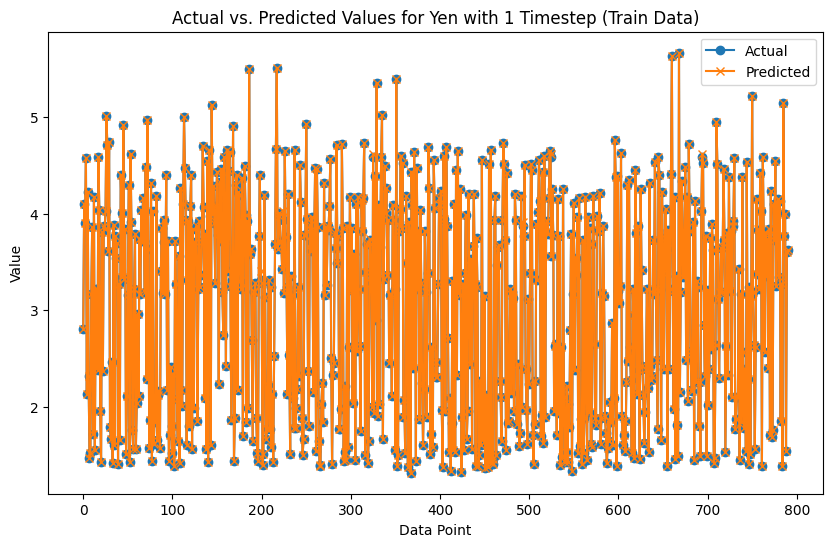

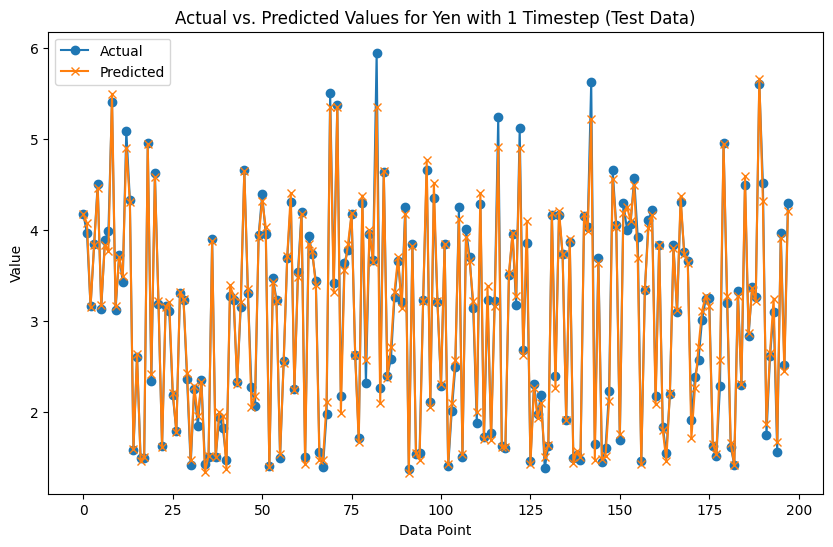

Test results for Yen with 1 timestep saved to Yen_test_results_timestep_1.csv


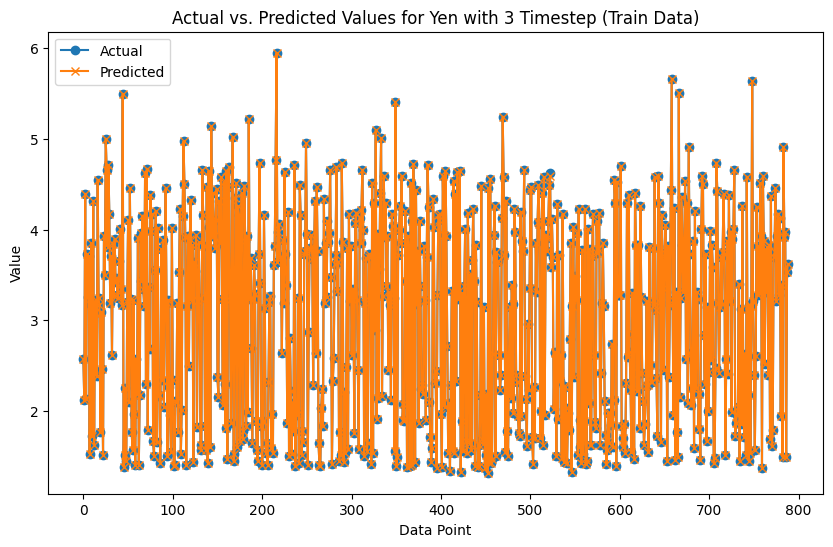

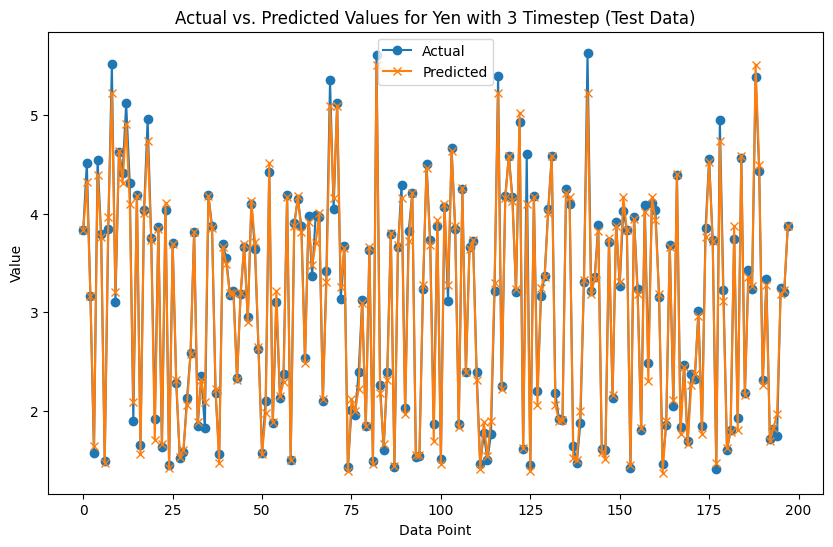

Test results for Yen with 3 timestep saved to Yen_test_results_timestep_3.csv


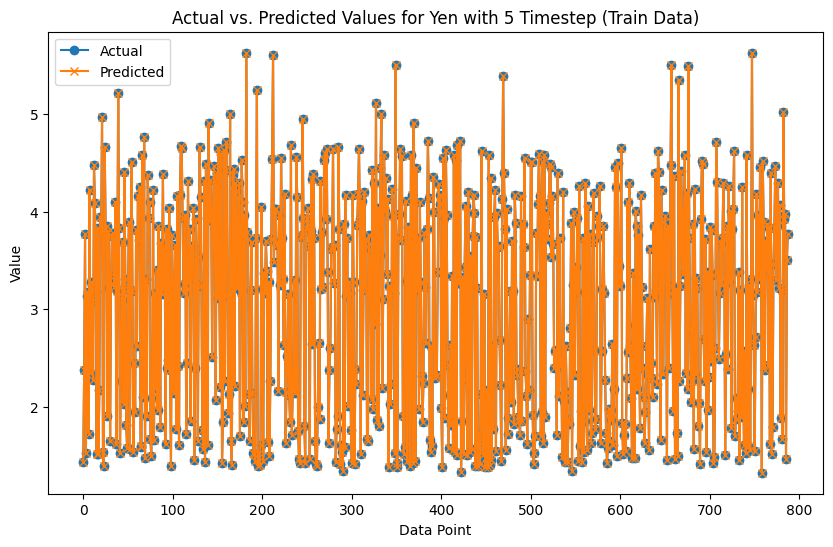

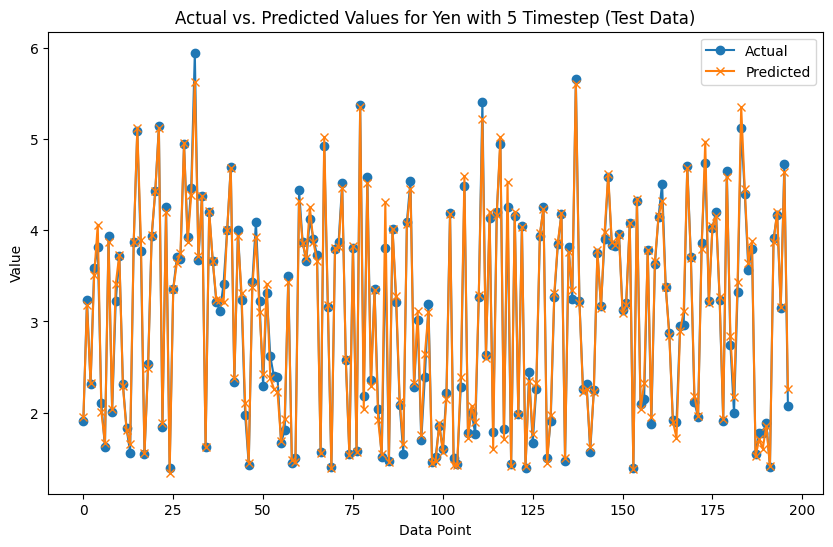

Test results for Yen with 5 timestep saved to Yen_test_results_timestep_5.csv


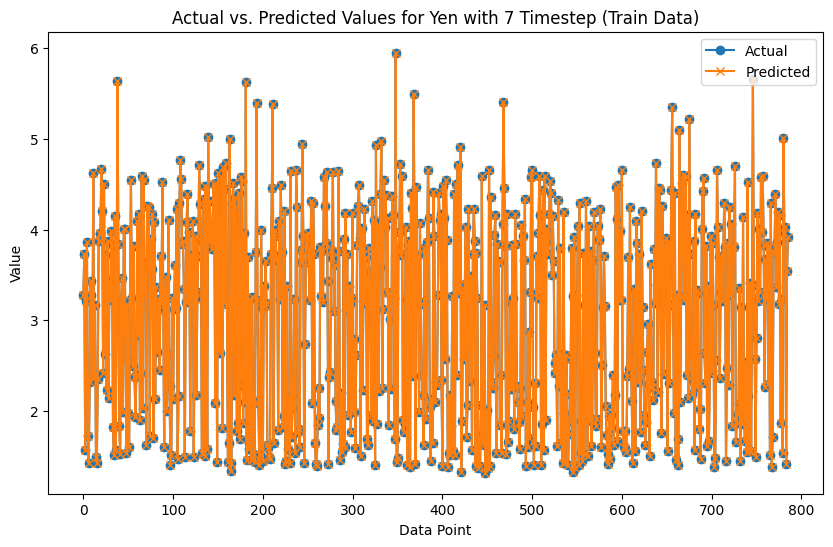

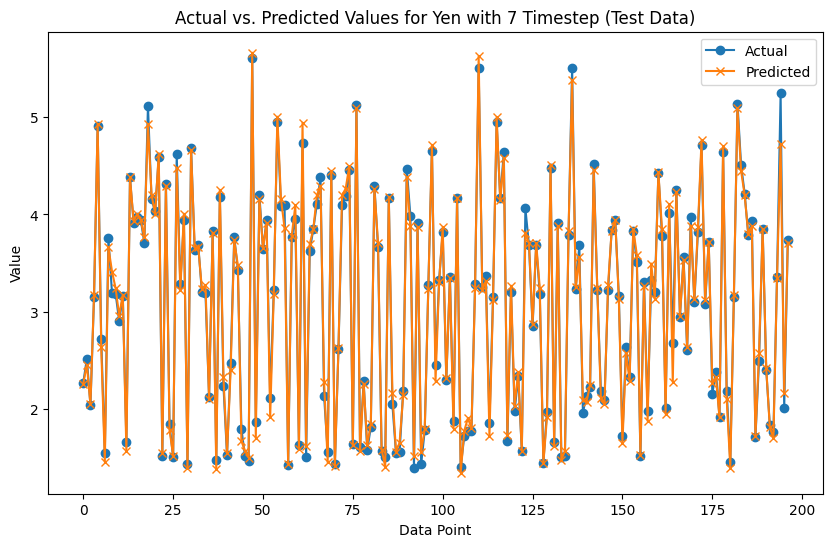

Test results for Yen with 7 timestep saved to Yen_test_results_timestep_7.csv


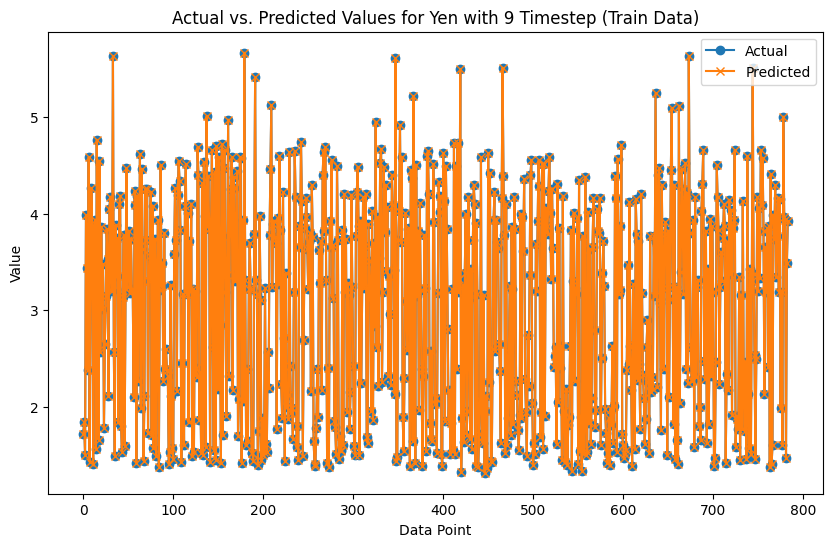

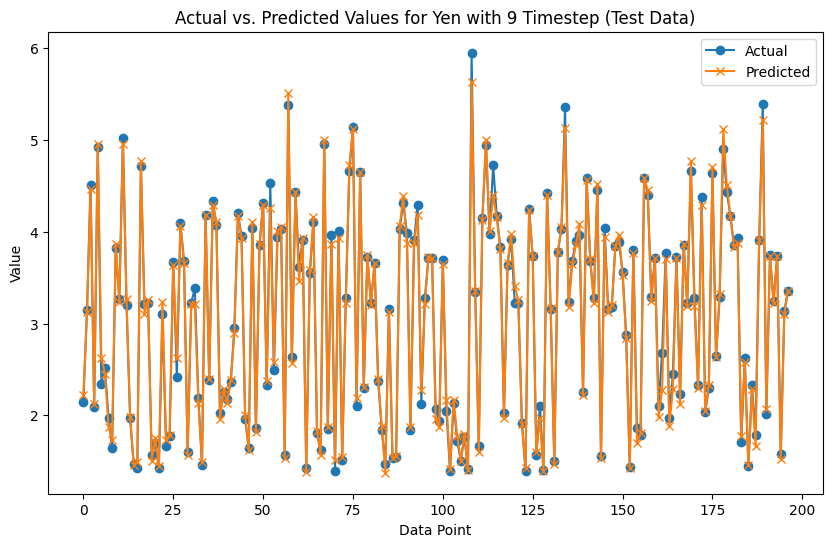

Test results for Yen with 9 timestep saved to Yen_test_results_timestep_9.csv


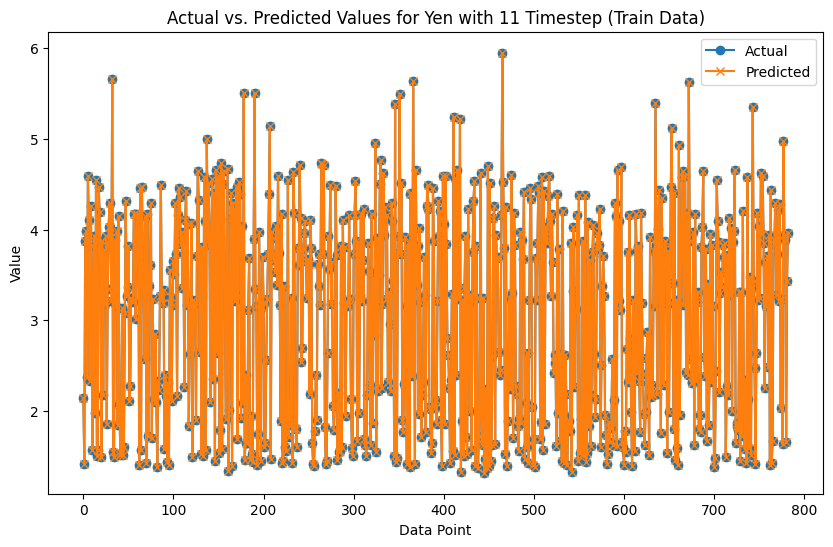

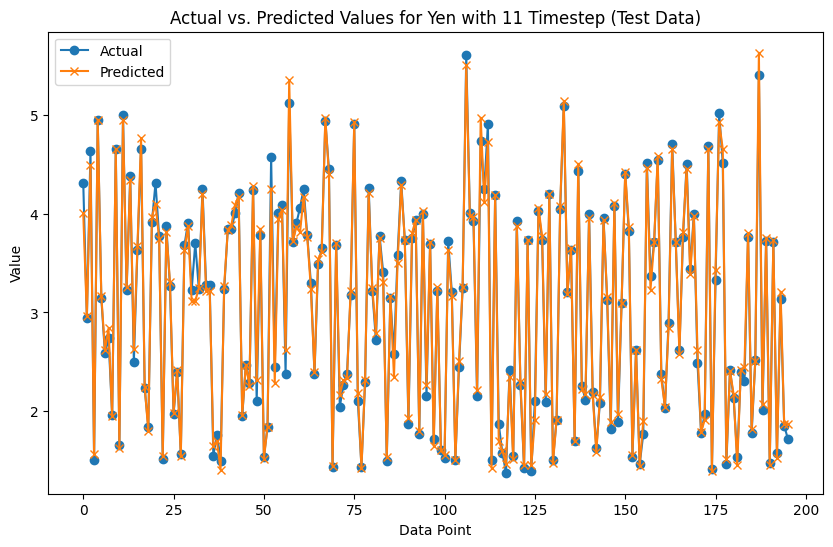

Test results for Yen with 11 timestep saved to Yen_test_results_timestep_11.csv


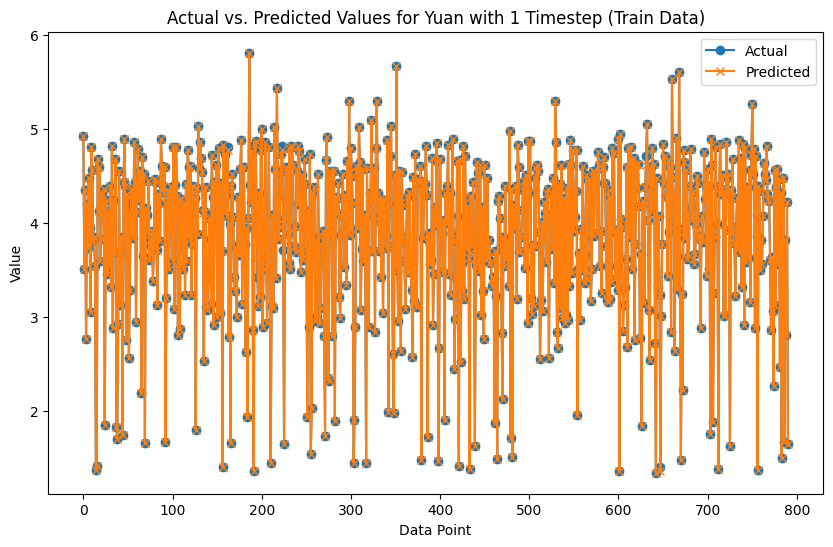

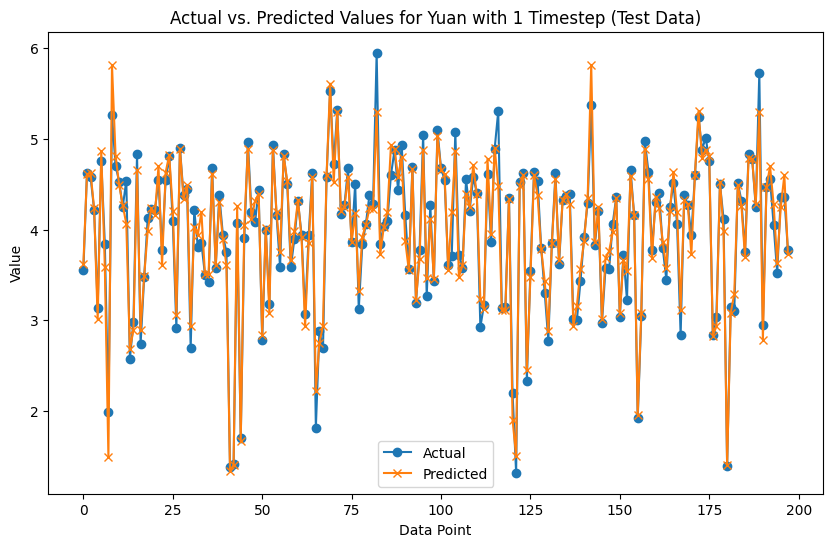

Test results for Yuan with 1 timestep saved to Yuan_test_results_timestep_1.csv


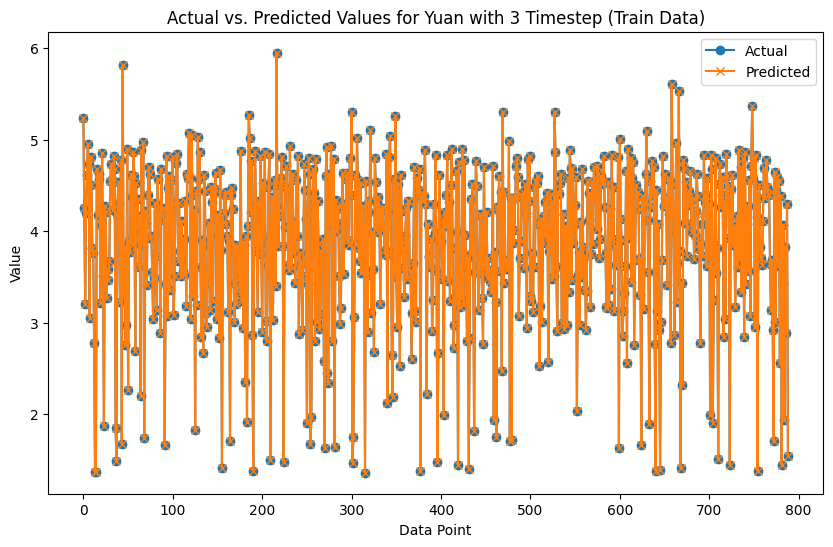

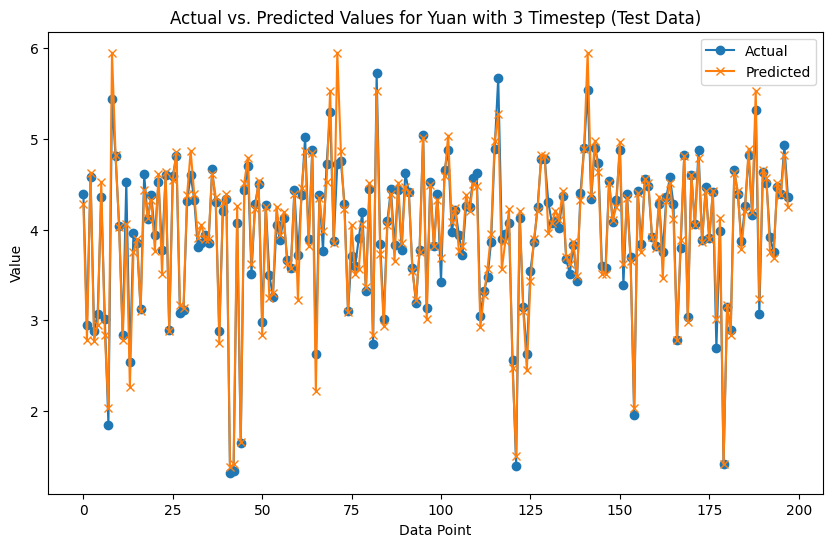

Test results for Yuan with 3 timestep saved to Yuan_test_results_timestep_3.csv


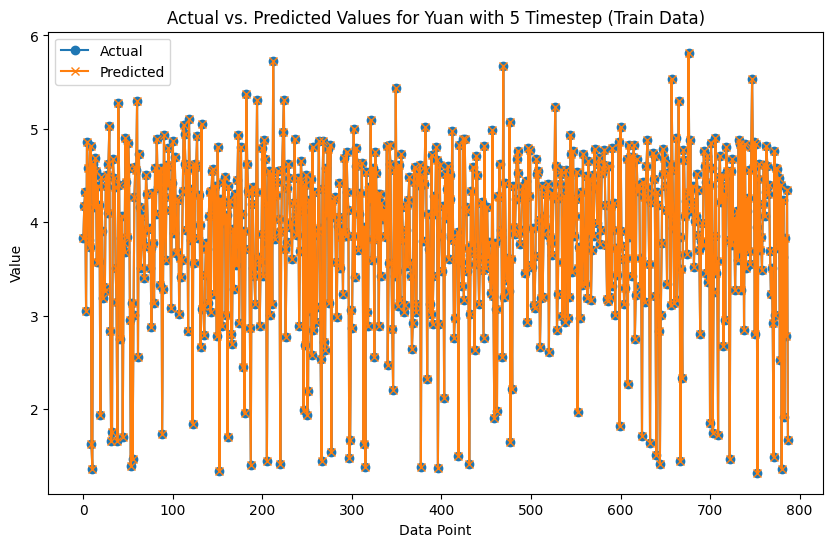

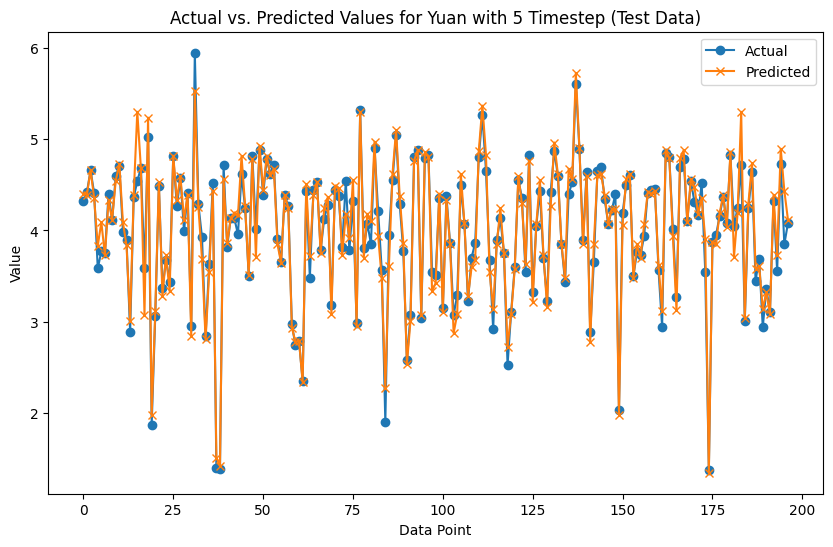

Test results for Yuan with 5 timestep saved to Yuan_test_results_timestep_5.csv


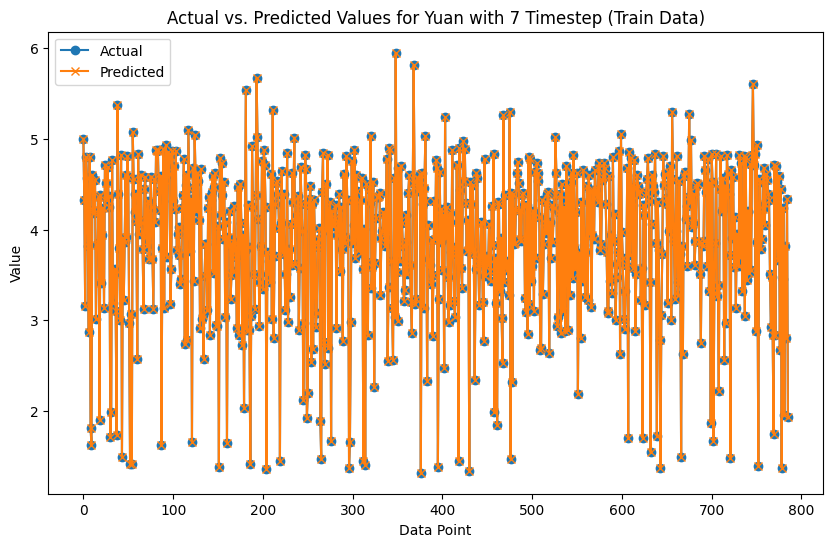

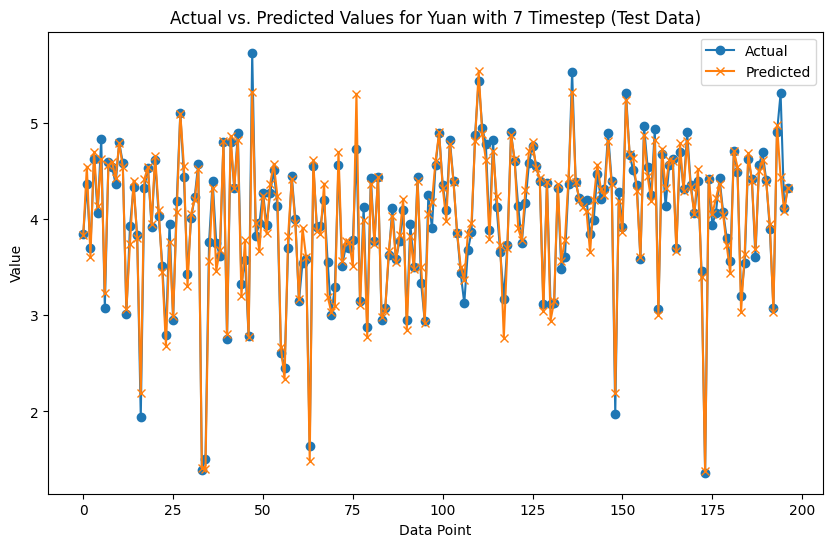

Test results for Yuan with 7 timestep saved to Yuan_test_results_timestep_7.csv


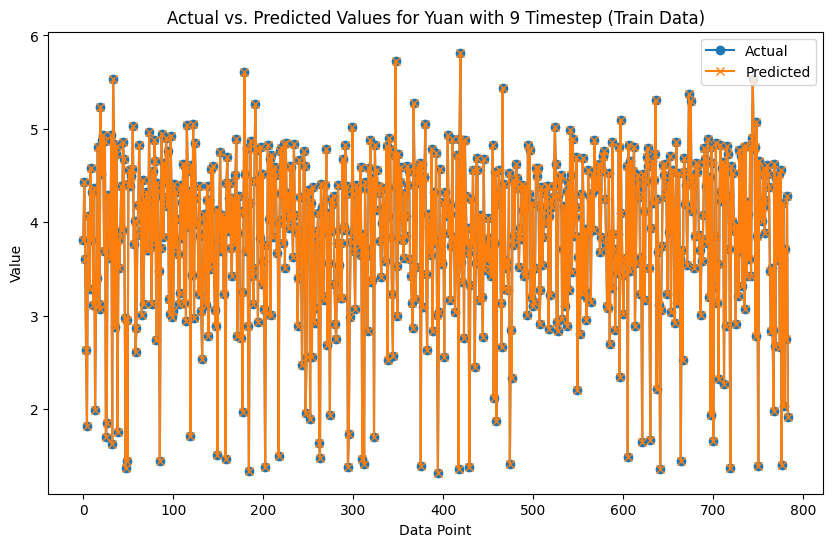

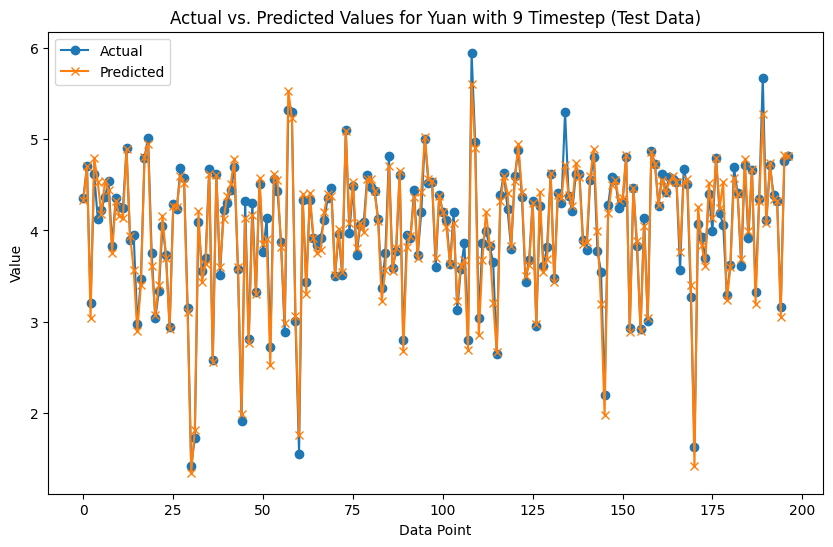

Test results for Yuan with 9 timestep saved to Yuan_test_results_timestep_9.csv


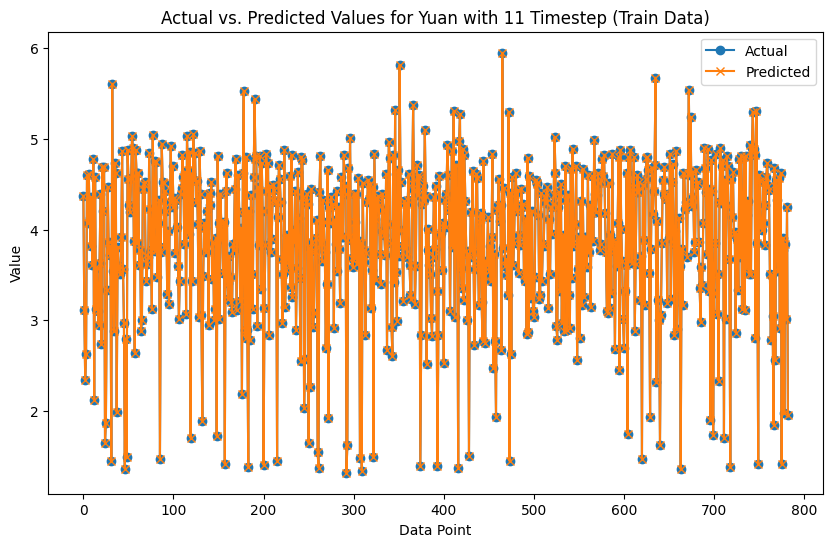

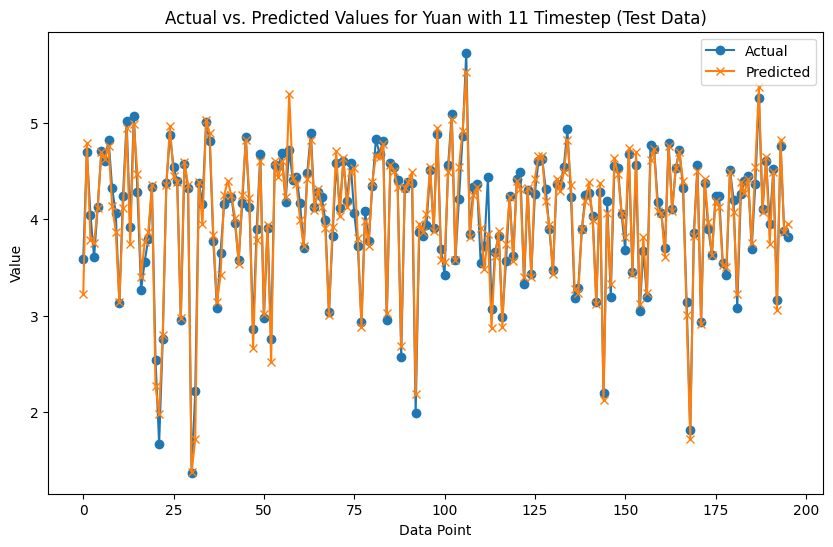

Test results for Yuan with 11 timestep saved to Yuan_test_results_timestep_11.csv


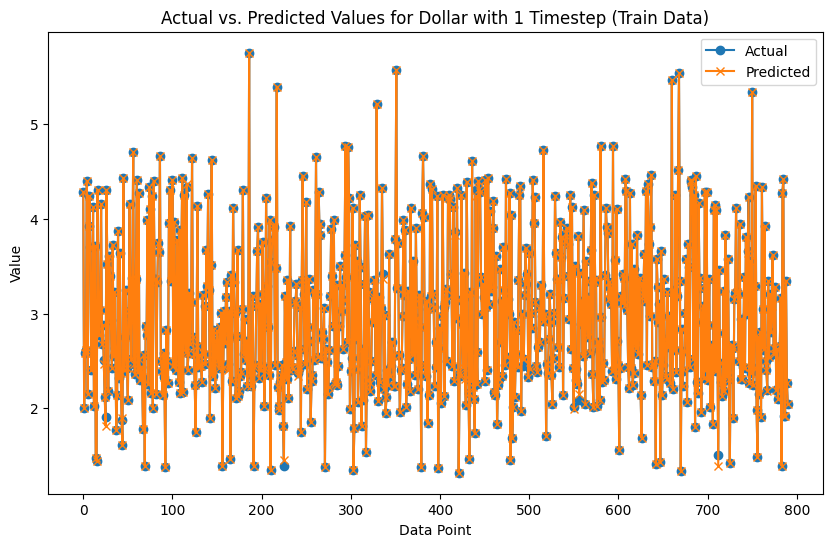

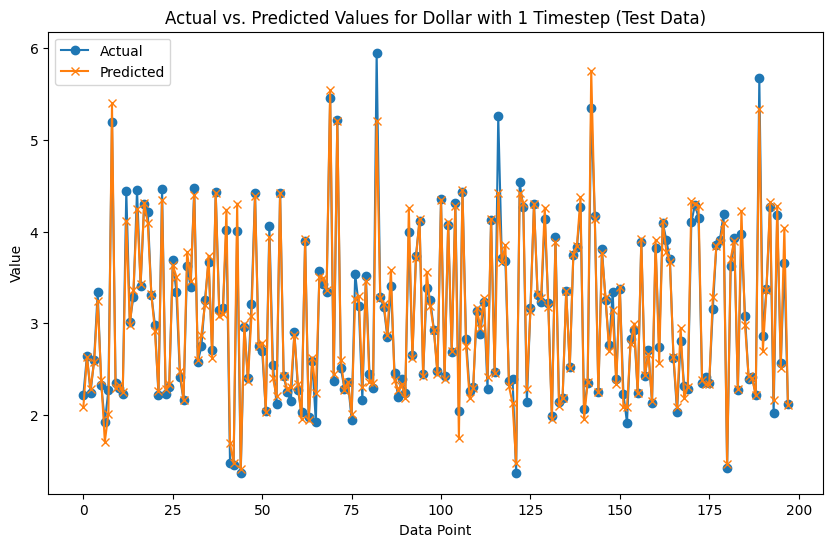

Test results for Dollar with 1 timestep saved to Dollar_test_results_timestep_1.csv


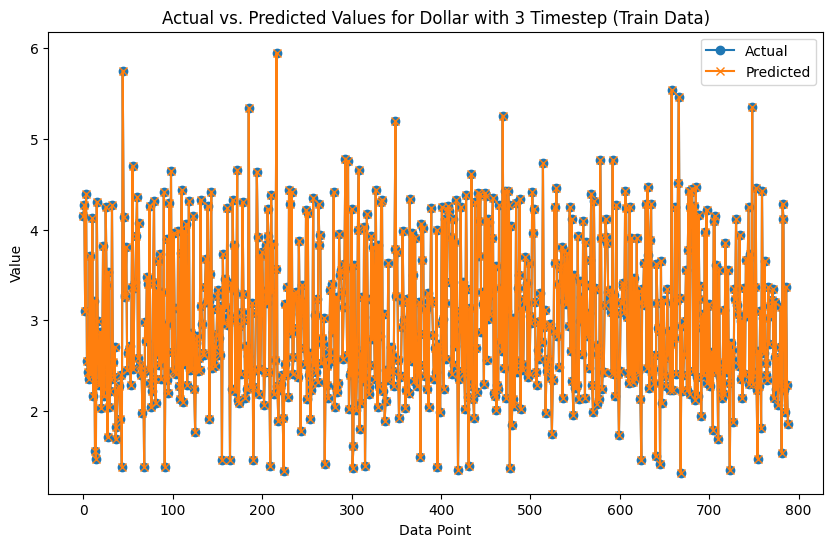

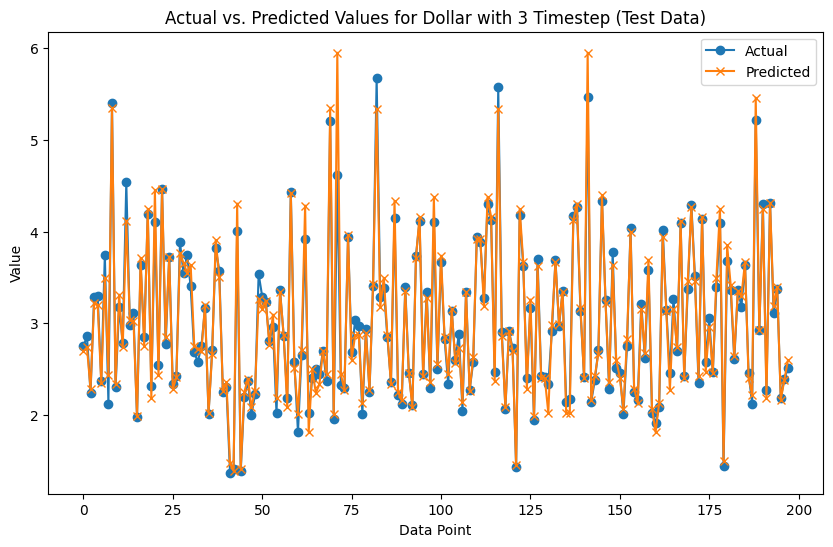

Test results for Dollar with 3 timestep saved to Dollar_test_results_timestep_3.csv


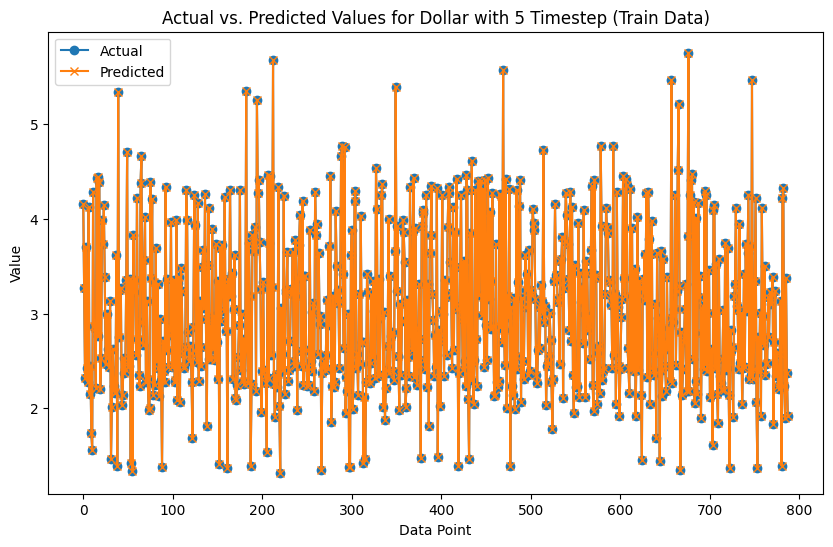

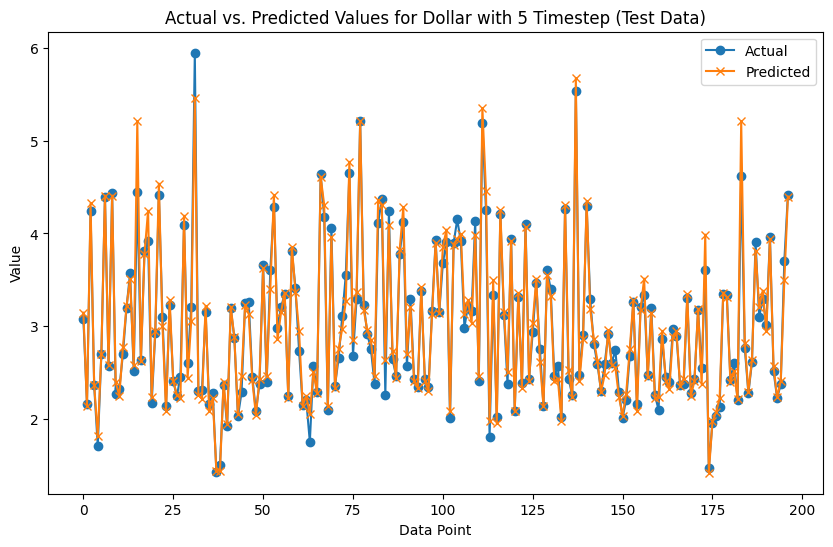

Test results for Dollar with 5 timestep saved to Dollar_test_results_timestep_5.csv


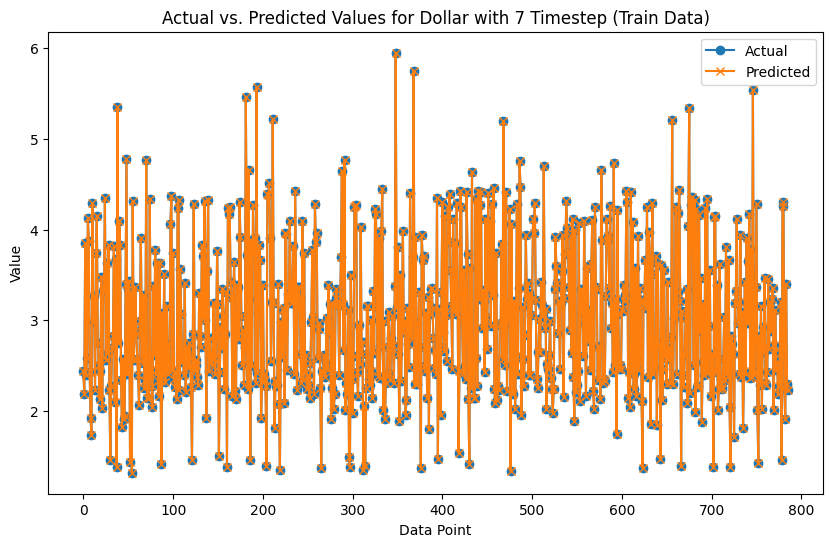

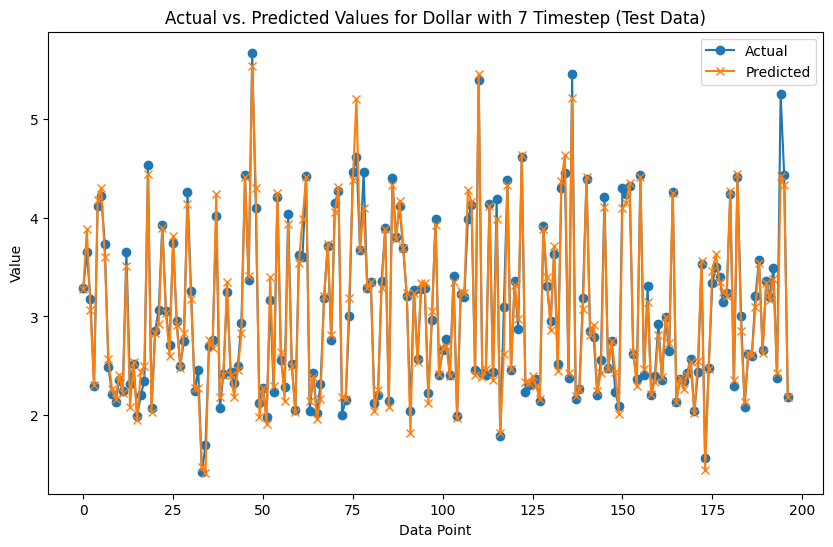

Test results for Dollar with 7 timestep saved to Dollar_test_results_timestep_7.csv


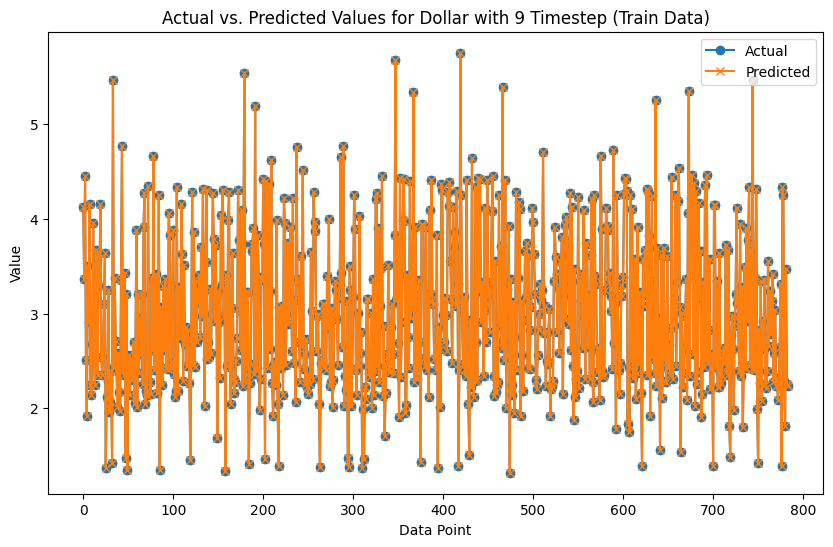

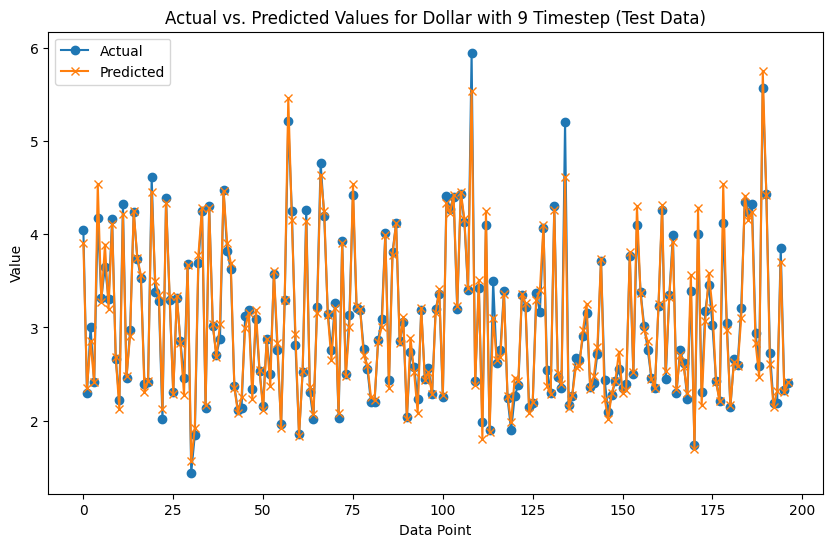

Test results for Dollar with 9 timestep saved to Dollar_test_results_timestep_9.csv


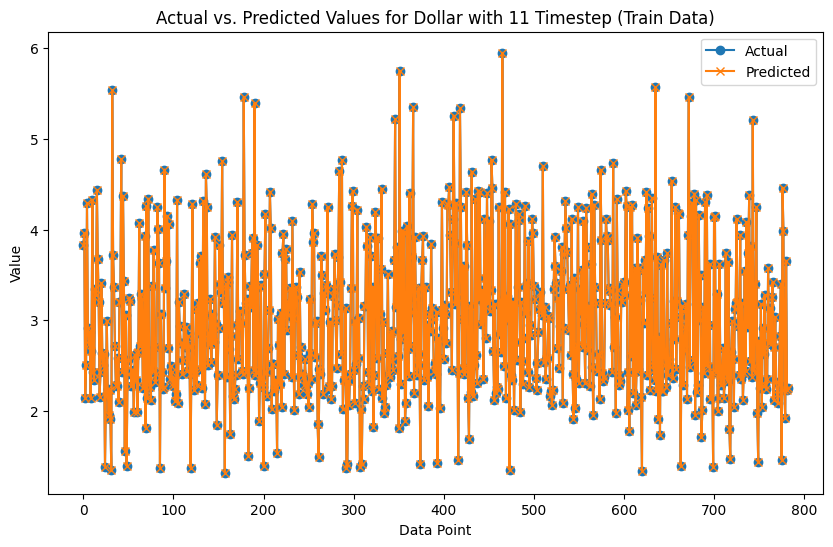

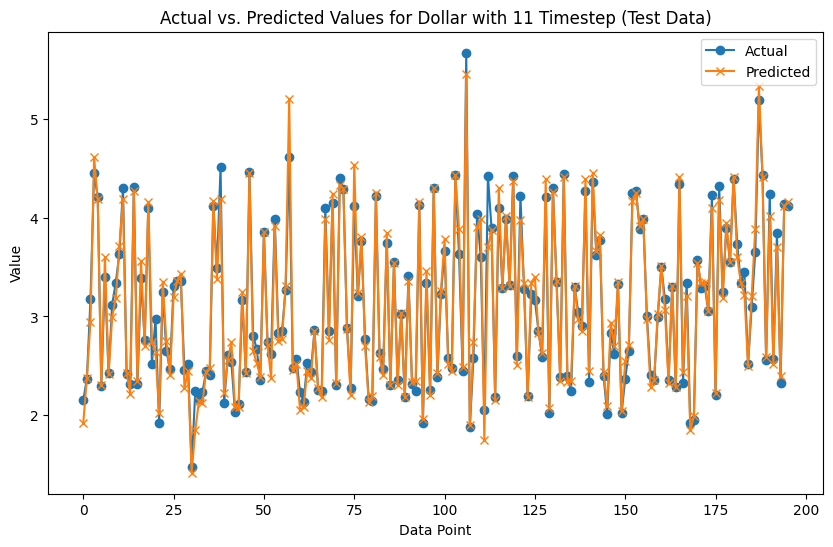

Test results for Dollar with 11 timestep saved to Dollar_test_results_timestep_11.csv
   Dataset  Timestep Data Type       MAE  R-square      Bias      MAPE
0      Yen         1     Train  0.000430  0.999976  0.000430  0.011098
1      Yen         1      Test  0.070451  0.992056 -0.007495  2.534442
2      Yen         3     Train  0.000044  0.999999 -0.000044  0.000964
3      Yen         3      Test  0.066781  0.992552 -0.019581  2.374671
4      Yen         5     Train  0.000000  1.000000  0.000000  0.000000
5      Yen         5      Test  0.065392  0.993121  0.005099  2.385207
6      Yen         7     Train  0.000000  1.000000  0.000000  0.000000
7      Yen         7      Test  0.060905  0.994039 -0.005835  2.302493
8      Yen         9     Train  0.000000  1.000000  0.000000  0.000000
9      Yen         9      Test  0.056365  0.994448 -0.009510  2.040061
10     Yen        11     Train  0.000000  1.000000  0.000000  0.000000
11     Yen        11      Test  0.060639  0.993096 -0.002962  

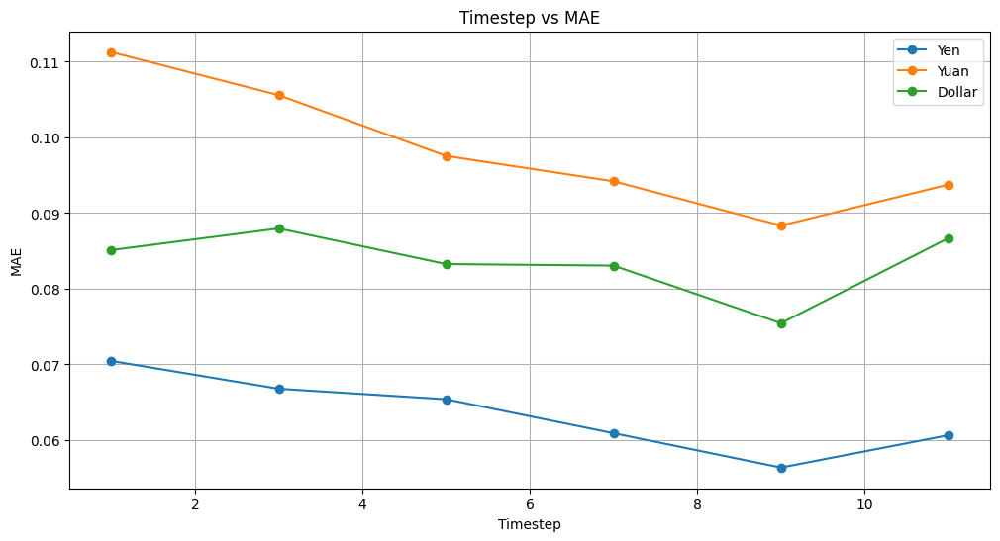

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk membangun model GRNN
def build_grnn_model():
    return KNeighborsRegressor(n_neighbors=1)

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    df['tanggal'] = pd.to_datetime(df['tanggal'])

    # Pisahkan kolom tanggal
    dates = df['tanggal'].values
    data_numeric = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    # Lakukan scaling hanya pada data numerik
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data_numeric)

    for n_steps in time_steps_options:
        X, y = create_sequences(data_scaled, n_steps, 1)

        X_train, X_test, y_train, y_test, dates_train, dates_test = train_test_split(X, y, dates[n_steps:], test_size=0.2, random_state=42)

        # Bentuk ulang X_train dan X_test untuk GRNN
        X_train = X_train.reshape(X_train.shape[0], -1)
        X_test = X_test.reshape(X_test.shape[0], -1)

        model = build_grnn_model()
        model.fit(X_train, y_train)

        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        # Menyusun kembali data yang akan didenormalisasi agar memiliki shape yang sesuai
        y_train_combined = np.concatenate((X_train[:, -1].reshape(-1, 1), y_train), axis=1)
        y_pred_train_combined = np.concatenate((X_train[:, -1].reshape(-1, 1), y_pred_train.reshape(-1, 1)), axis=1)
        y_test_combined = np.concatenate((X_test[:, -1].reshape(-1, 1), y_test), axis=1)
        y_pred_test_combined = np.concatenate((X_test[:, -1].reshape(-1, 1), y_pred_test.reshape(-1, 1)), axis=1)

        # Tambahkan kolom dummy
        y_train_combined = np.concatenate([y_train_combined, np.zeros((y_train_combined.shape[0], 2))], axis=1)
        y_pred_train_combined = np.concatenate([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 2))], axis=1)
        y_test_combined = np.concatenate([y_test_combined, np.zeros((y_test_combined.shape[0], 2))], axis=1)
        y_pred_test_combined = np.concatenate([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 2))], axis=1)

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -3]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -3]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -3]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -3]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Membuat DataFrame untuk data actual dan predicted test dengan tanggal
        test_results_df = pd.DataFrame({
            'Date': dates_test,
            'Actual': y_test_denorm,
            'Predicted': y_pred_test_denorm
        })

        # Simpan DataFrame ke file CSV
        test_results_df.to_csv(f'{name}_test_results_timestep_{n_steps}.csv', index=False)

        print(f"Test results for {name} with {n_steps} timestep saved to {name}_test_results_timestep_{n_steps}.csv")

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Plot MAE terhadap timestep untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    plt.figure(figsize=(12, 6))
    for dataset in results_df['Dataset'].unique():
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


<Figure size 1200x600 with 0 Axes>

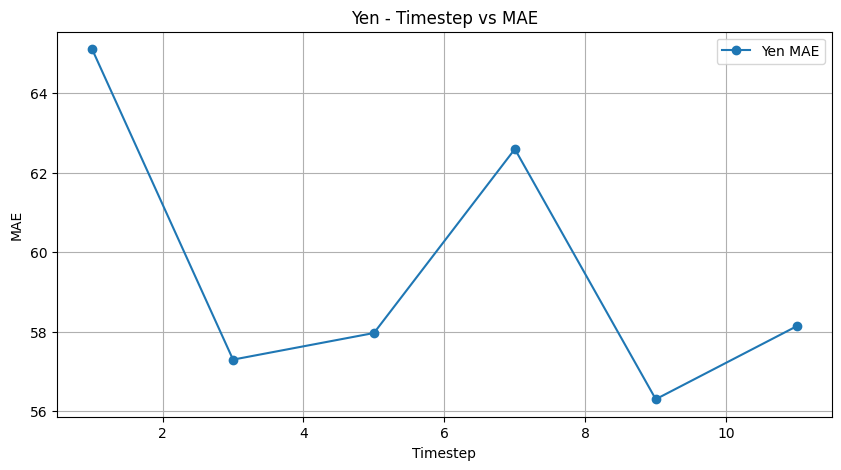

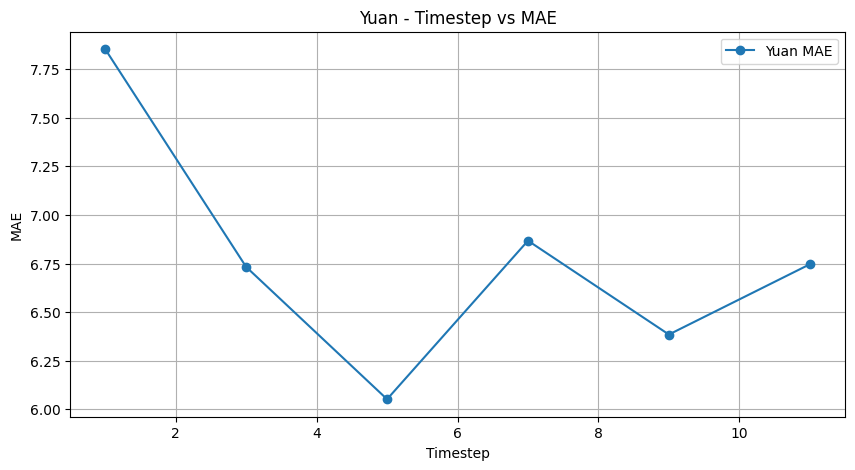

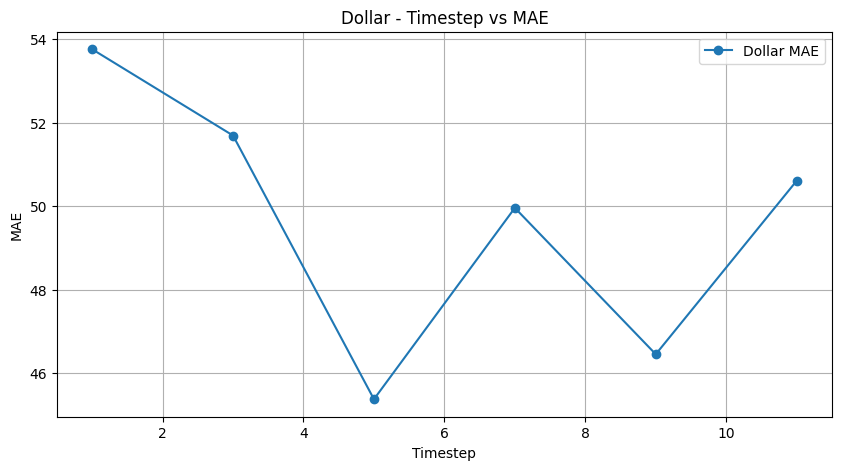

In [ ]:
# Fungsi untuk memplot MAE terhadap timestep untuk setiap dataset secara terpisah
def plot_timestep_vs_metric_separately(results_df, metric):
    plt.figure(figsize=(12, 6))
    for dataset in results_df['Dataset'].unique():
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.figure(figsize=(10, 5))
        plt.plot(data['Timestep'], data[metric], marker='o', label=f'{dataset} {metric}')
        plt.title(f'{dataset} - Timestep vs {metric}')
        plt.xlabel('Timestep')
        plt.ylabel(metric)
        plt.legend()
        plt.grid(True)
        plt.show()

# Plot MAE terhadap timestep untuk setiap dataset secara terpisah
plot_timestep_vs_metric_separately(results_df, 'MAE')


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Executing warm start...
Warm start concluded. The optimum isotropic sigma is [0.01507592]
Gradient search concluded. The optimum sigma is [0.015      0.01495447 0.01509949]


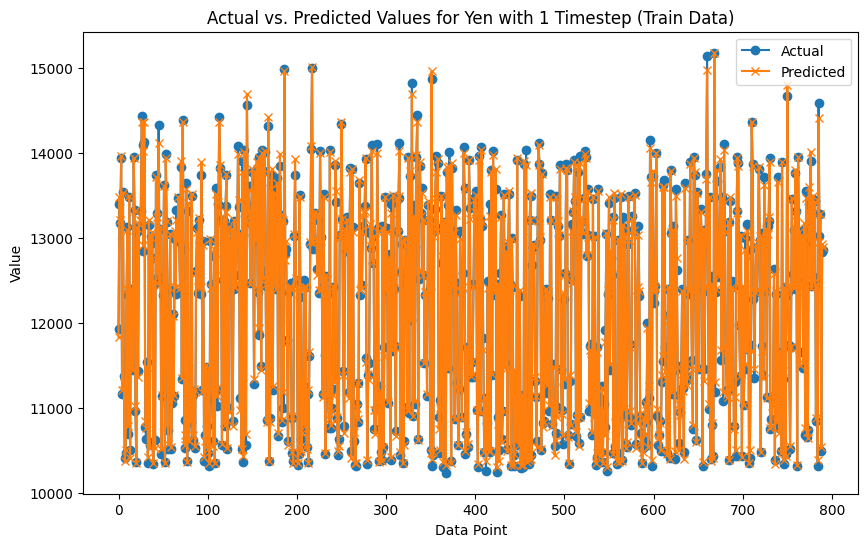

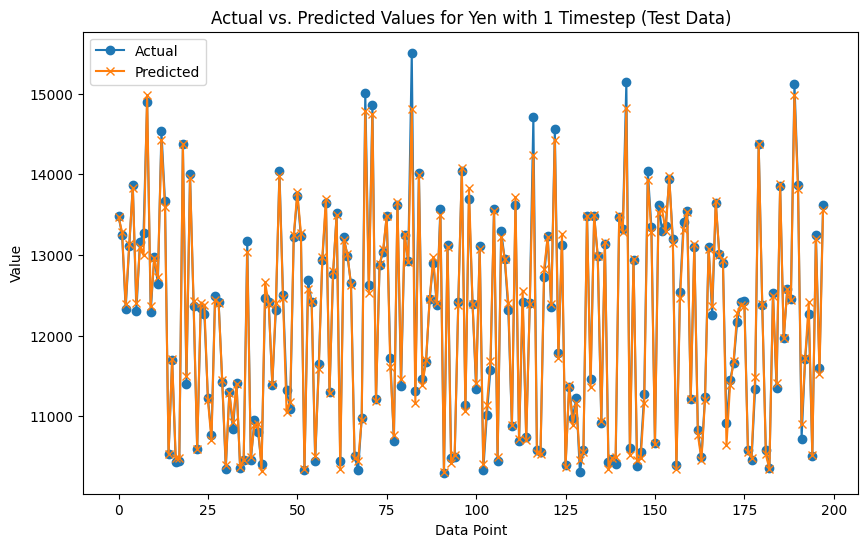

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Executing warm start...
Warm start concluded. The optimum isotropic sigma is [0.02368425]
Gradient search concluded. The optimum sigma is [1.45528158e-02 1.20600740e-01 4.75848100e-01 1.08359023e-01
 1.08823278e-01 2.73056129e-01 2.35058615e-07 3.38581511e-02
 1.40649216e-02]


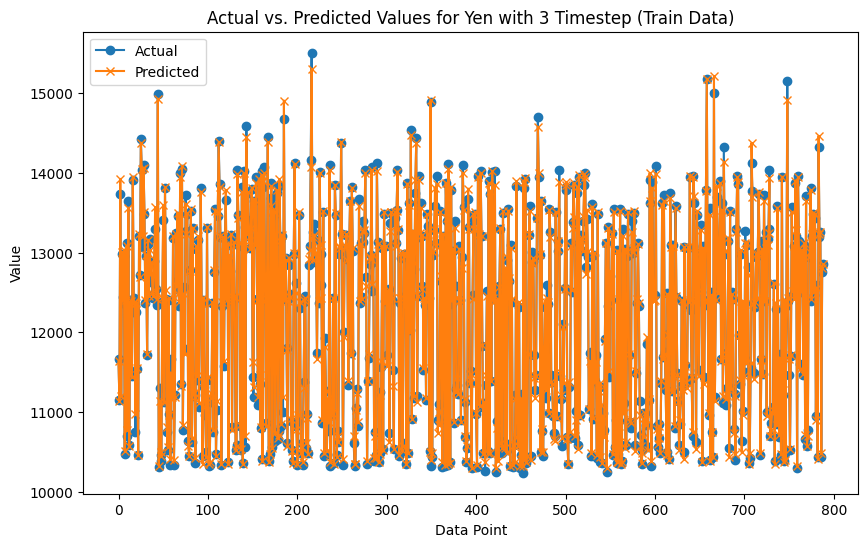

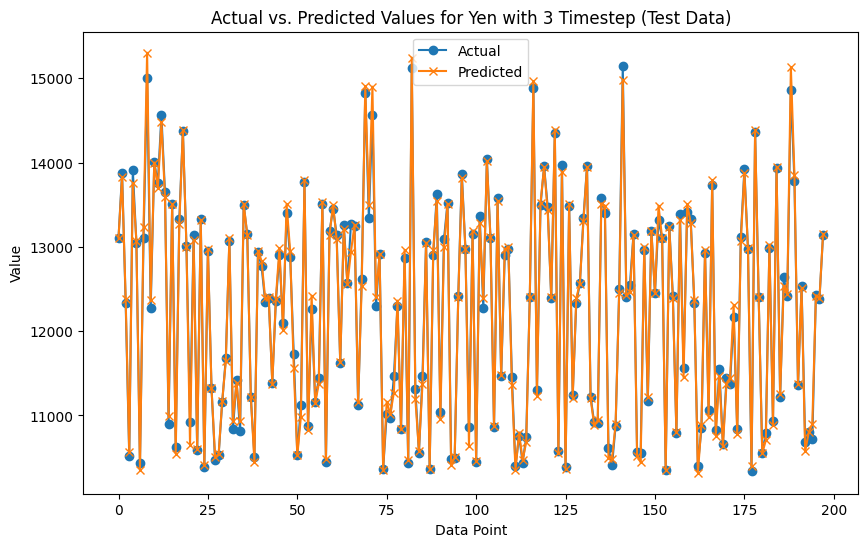

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Executing warm start...
Warm start concluded. The optimum isotropic sigma is [0.02238061]
Gradient search concluded. The optimum sigma is [0.03160891 0.04250791 0.2167714  0.03300792 0.0383049  0.04408137
 0.13166763 0.14755251 0.24242475 0.14082142 0.14101518 0.32482276
 0.15651973 0.04262076 0.01244811]


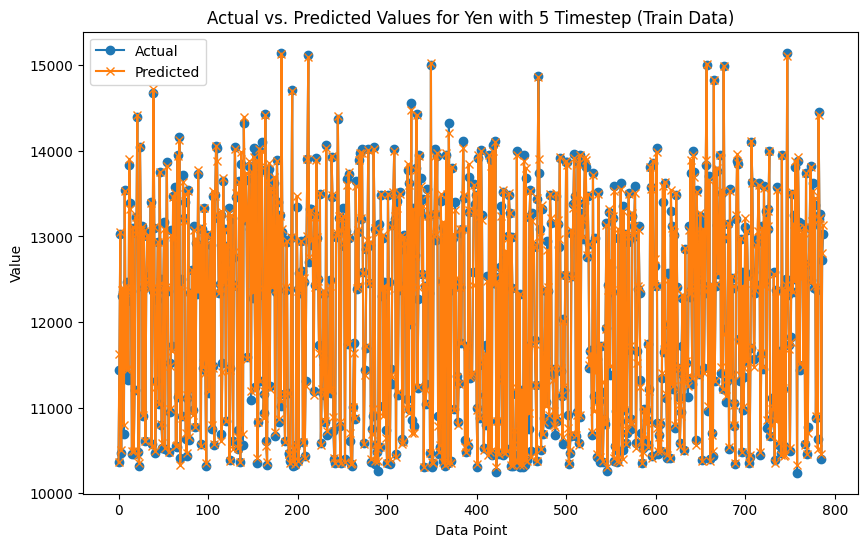

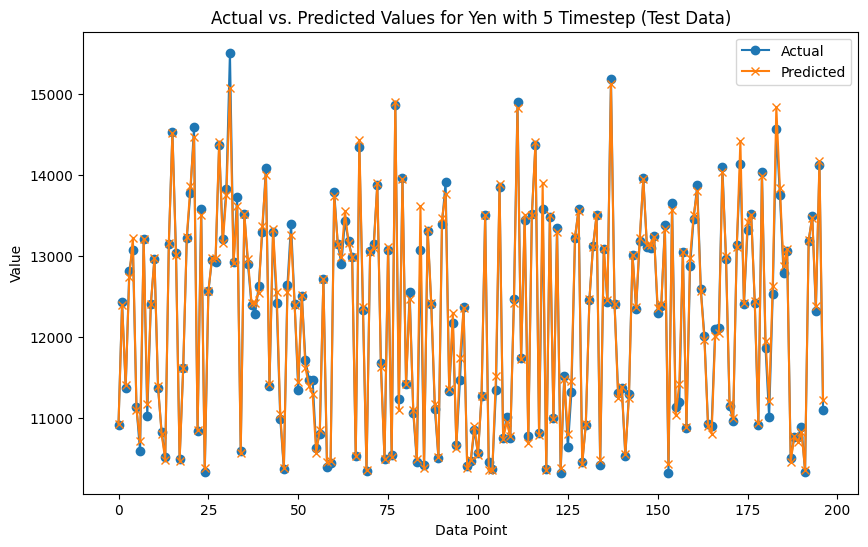

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Executing warm start...
Warm start concluded. The optimum isotropic sigma is [0.02661837]


KeyboardInterrupt: 

In [ ]:
!pip install pyGRNN
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from pyGRNN import GRNN
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    scaler = MinMaxScaler()
    df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']] = scaler.fit_transform(df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']])
    data = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    for n_steps in time_steps_options:
        X, y = create_sequences(data, n_steps, 1)
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Flatten the 3D input data to 2D
        X_train_flattened = X_train.reshape(X_train.shape[0], -1)
        X_test_flattened = X_test.reshape(X_test.shape[0], -1)

        grnn = GRNN()
        grnn.fit(X_train_flattened, y_train)
        y_pred_train = grnn.predict(X_train_flattened)
        y_pred_test = grnn.predict(X_test_flattened)

        # Denormalisasi hasil prediksi dan data aktual
        y_train_combined = np.hstack([X_train[:, -1, :-1], y_train.reshape(-1, 1)])
        y_pred_train_combined = np.hstack([X_train[:, -1, :-1], y_pred_train.reshape(-1, 1)])
        y_test_combined = np.hstack([X_test[:, -1, :-1], y_test.reshape(-1, 1)])
        y_pred_test_combined = np.hstack([X_test[:, -1, :-1], y_pred_test.reshape(-1, 1)])

        # Menambahkan kolom dummy untuk menjaga bentuk yang sesuai
        y_train_combined = np.hstack([y_train_combined, np.zeros((y_train_combined.shape[0], 1))])
        y_pred_train_combined = np.hstack([y_pred_train_combined, np.zeros((y_pred_train_combined.shape[0], 1))])
        y_test_combined = np.hstack([y_test_combined, np.zeros((y_test_combined.shape[0], 1))])
        y_pred_test_combined = np.hstack([y_pred_test_combined, np.zeros((y_pred_test_combined.shape[0], 1))])

        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -2]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -2]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -2]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -2]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Menyimpan hasil denormalisasi ke CSV untuk data testing
        test_results_df = pd.DataFrame({
            'Actual': y_test_denorm,
            'Predicted': y_pred_test_denorm
        })
        test_results_df.to_csv(f'{name}_test_results_timestep_{n_steps}.csv', index=False)

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Fungsi untuk visualisasi Timestep terhadap MAE untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    datasets = results_df['Dataset'].unique()
    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')


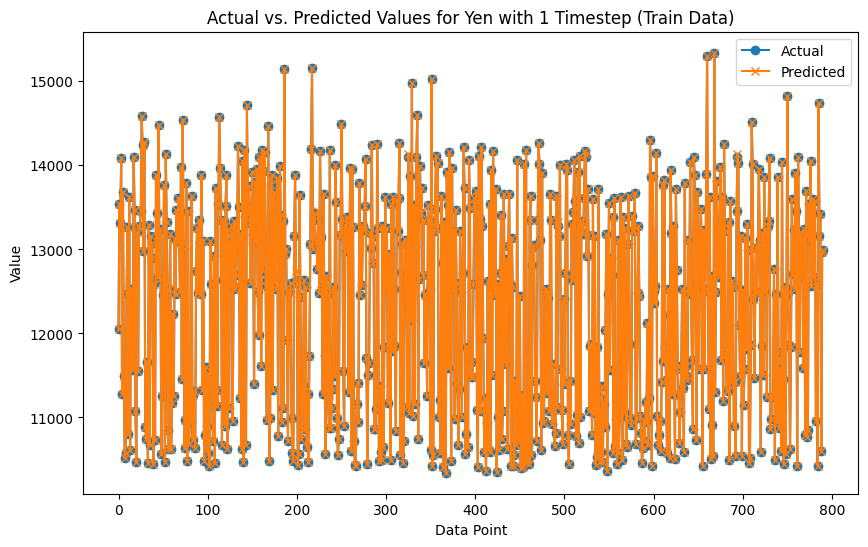

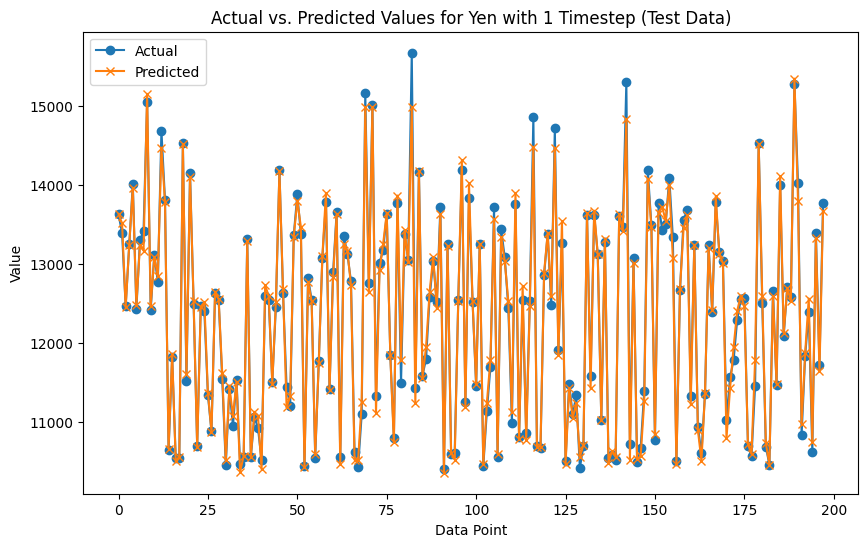

Test results for Yen with 1 timestep saved to Yen_test_results_timestep_1.csv


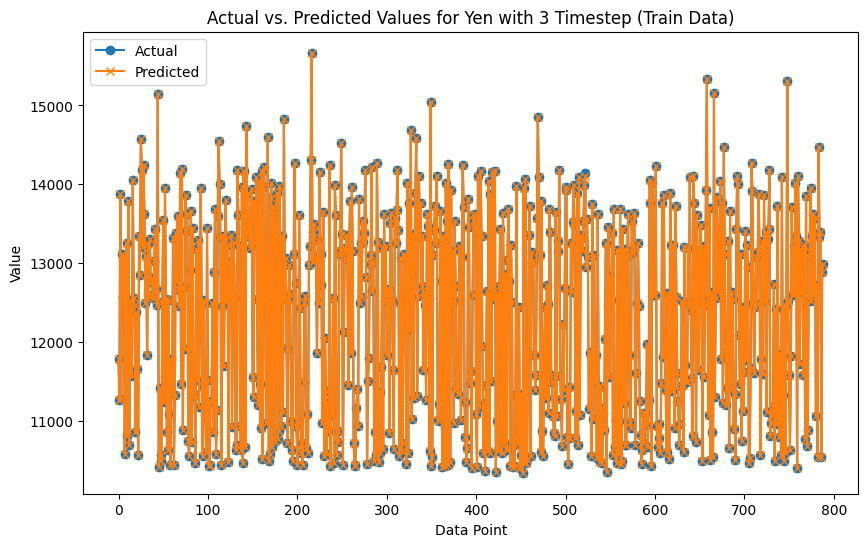

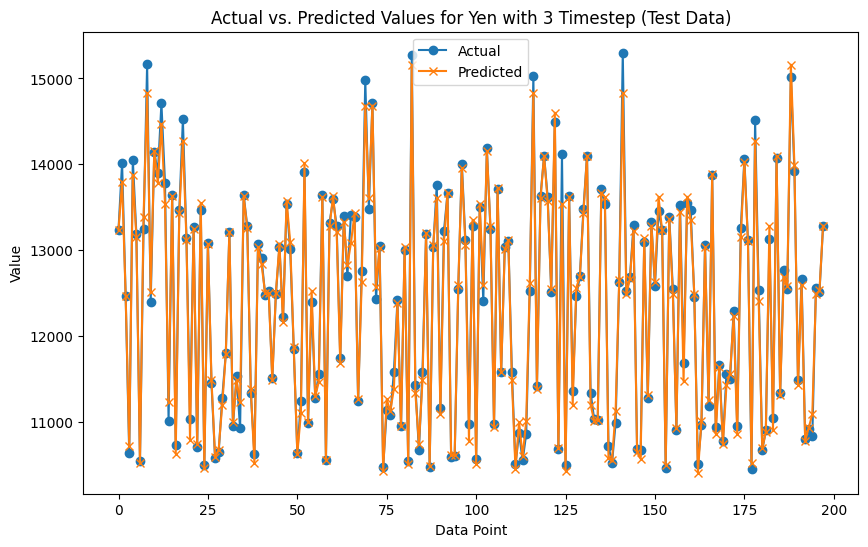

Test results for Yen with 3 timestep saved to Yen_test_results_timestep_3.csv


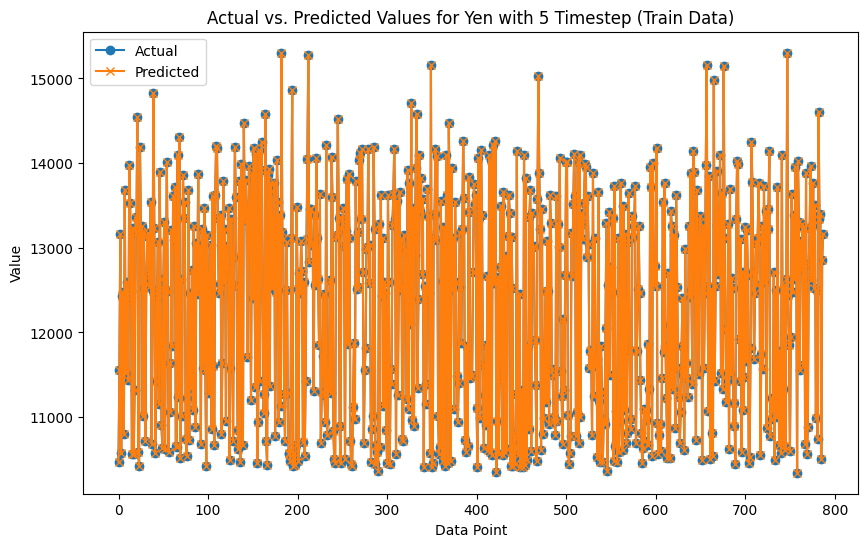

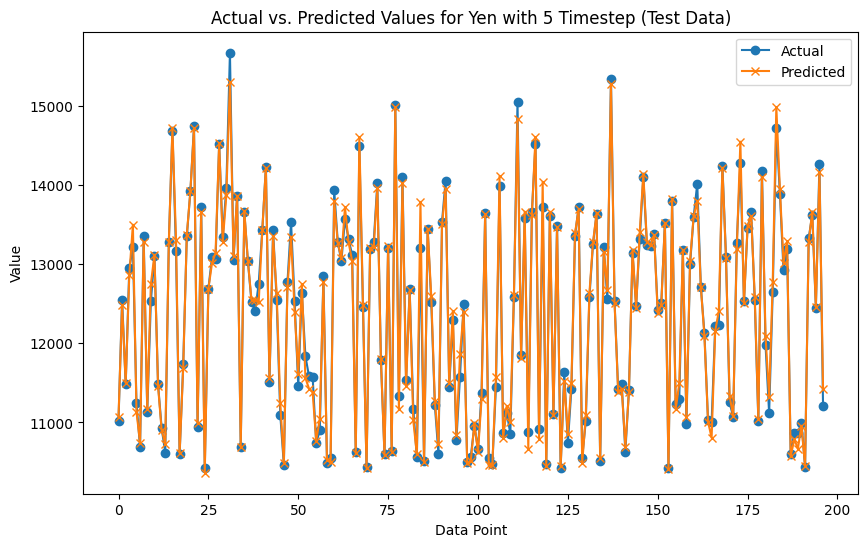

Test results for Yen with 5 timestep saved to Yen_test_results_timestep_5.csv


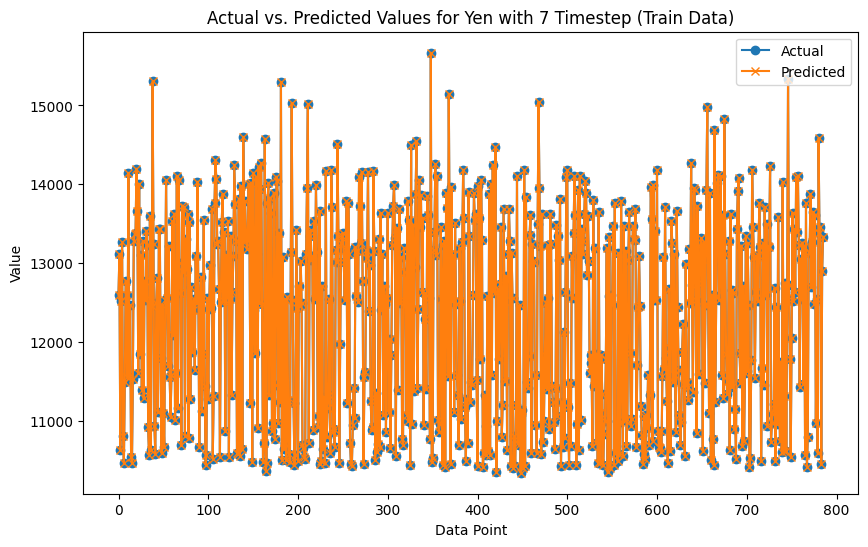

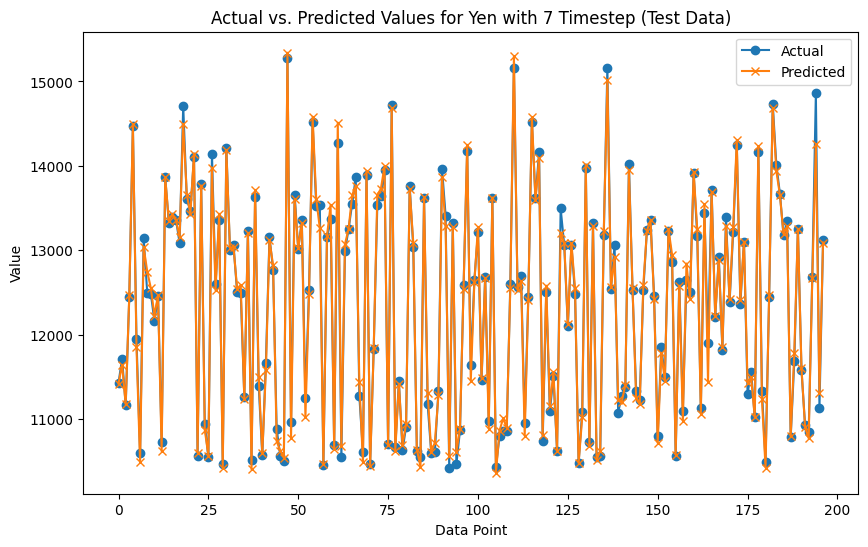

Test results for Yen with 7 timestep saved to Yen_test_results_timestep_7.csv


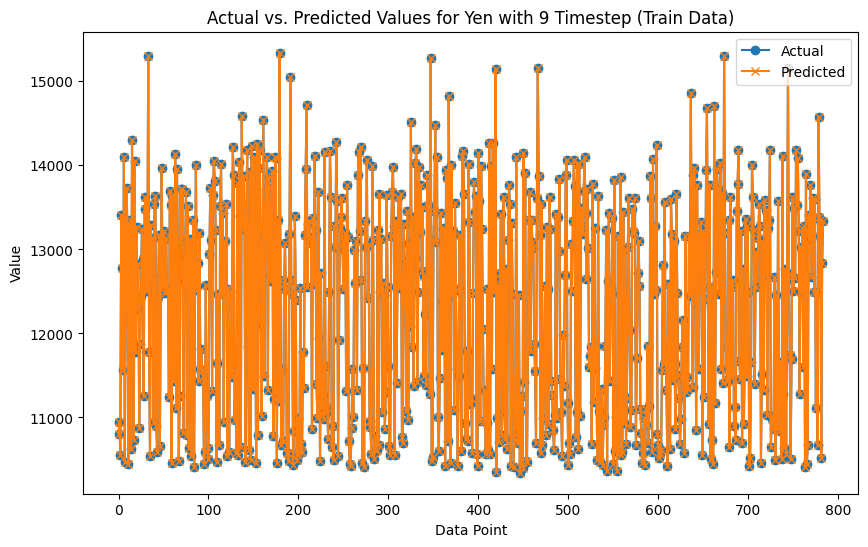

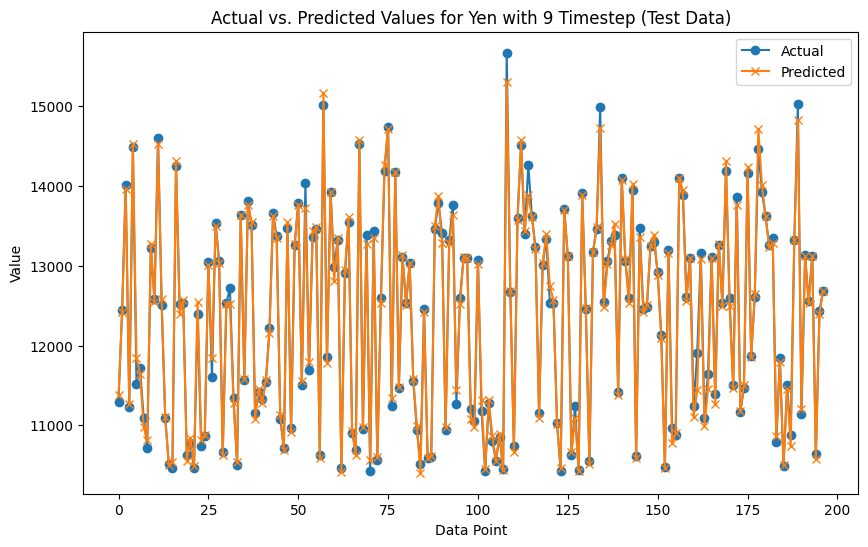

Test results for Yen with 9 timestep saved to Yen_test_results_timestep_9.csv


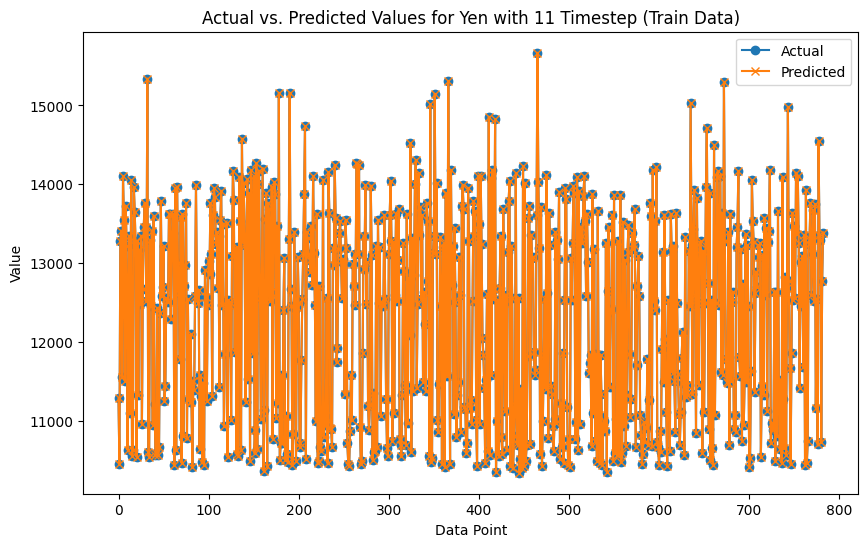

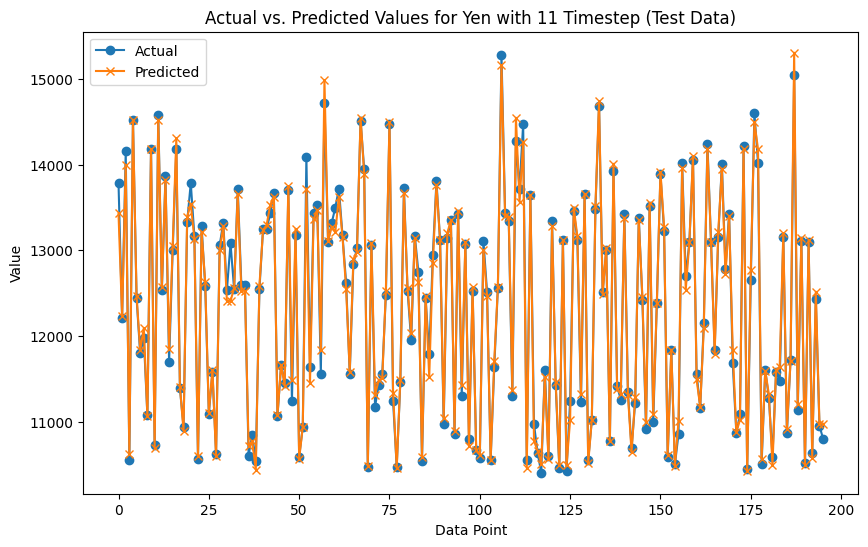

Test results for Yen with 11 timestep saved to Yen_test_results_timestep_11.csv


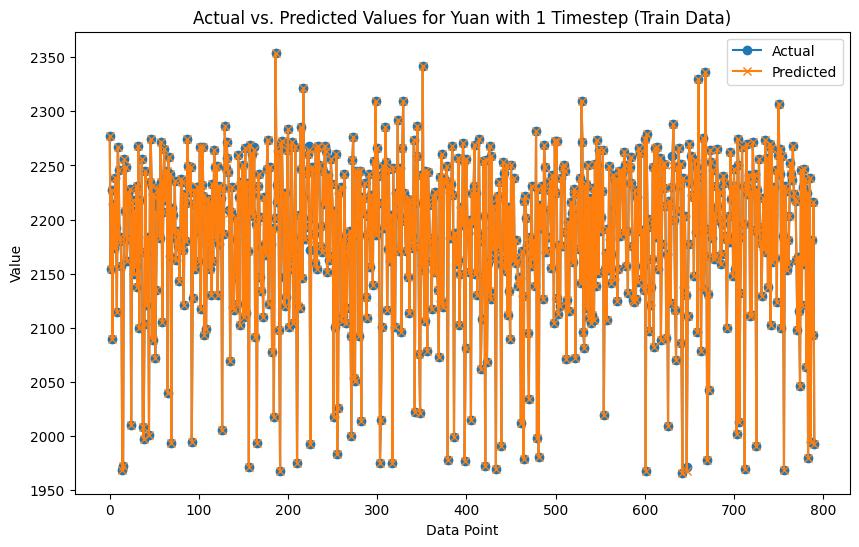

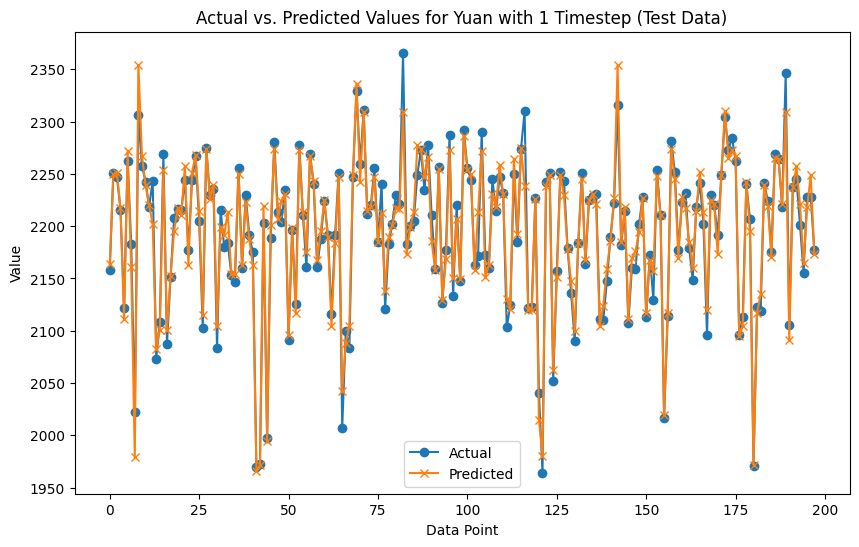

Test results for Yuan with 1 timestep saved to Yuan_test_results_timestep_1.csv


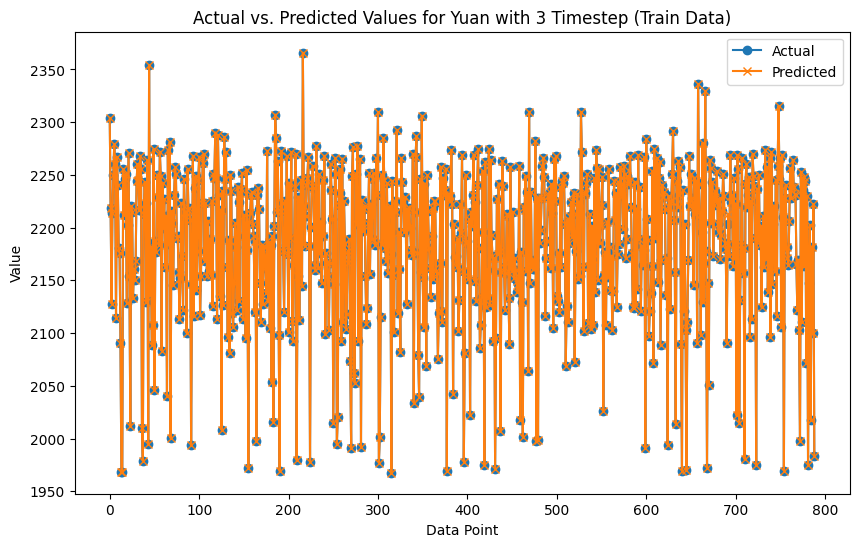

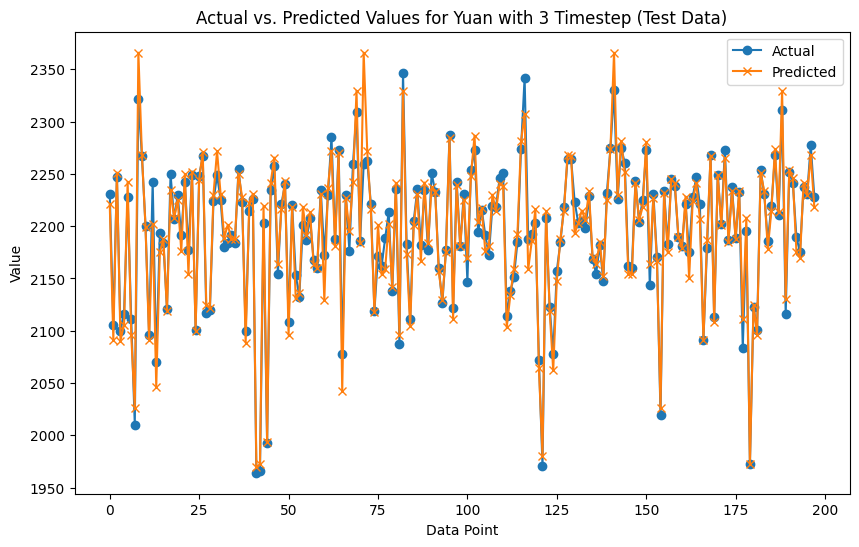

Test results for Yuan with 3 timestep saved to Yuan_test_results_timestep_3.csv


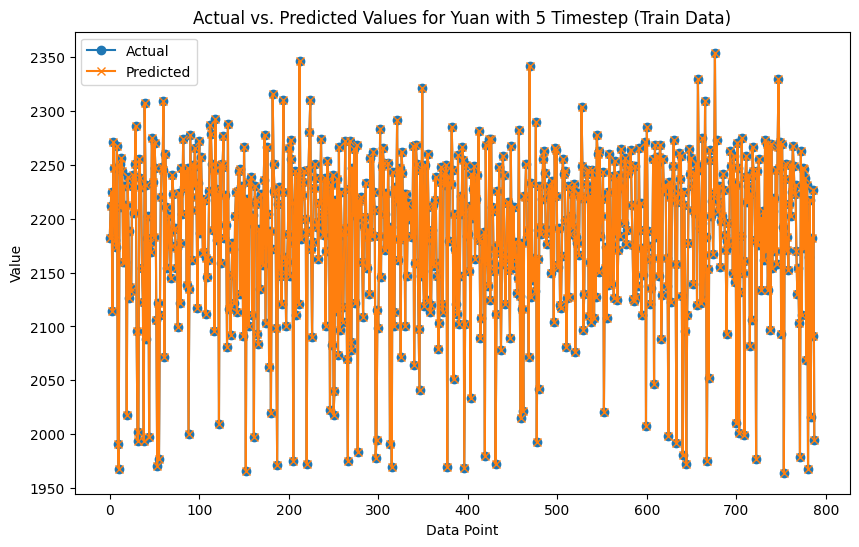

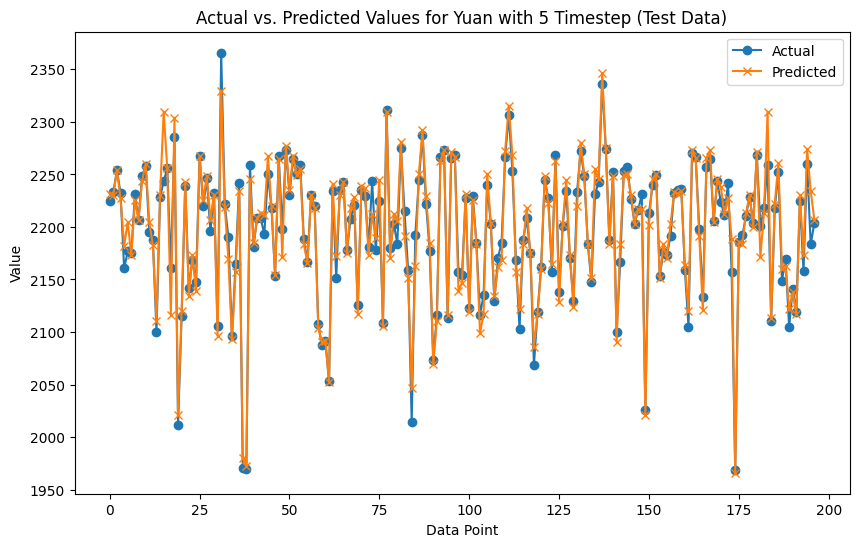

Test results for Yuan with 5 timestep saved to Yuan_test_results_timestep_5.csv


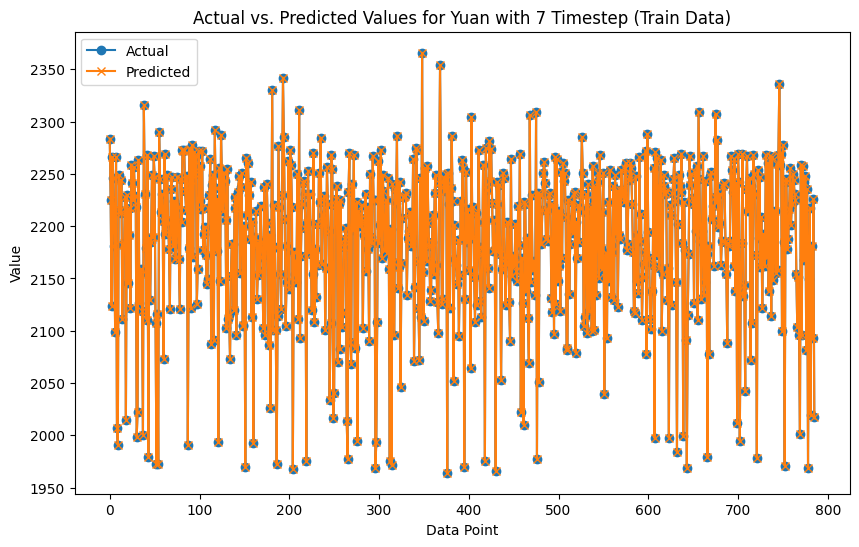

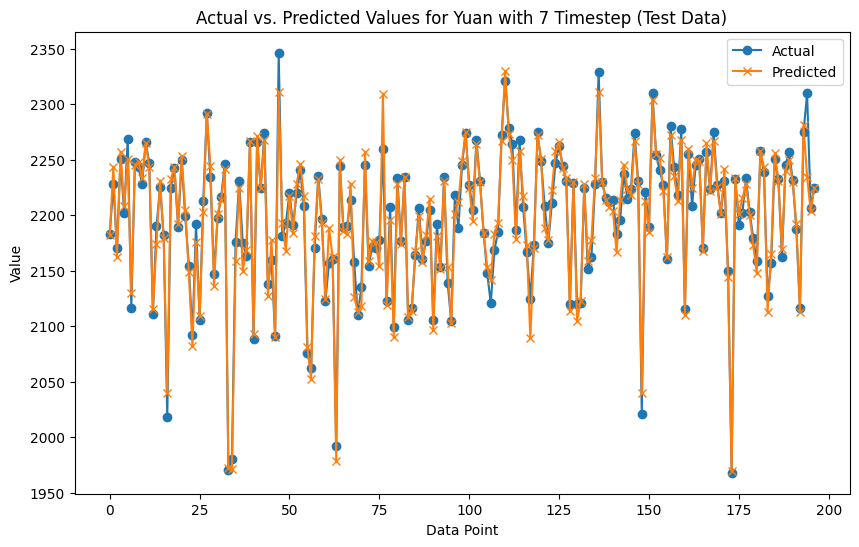

Test results for Yuan with 7 timestep saved to Yuan_test_results_timestep_7.csv


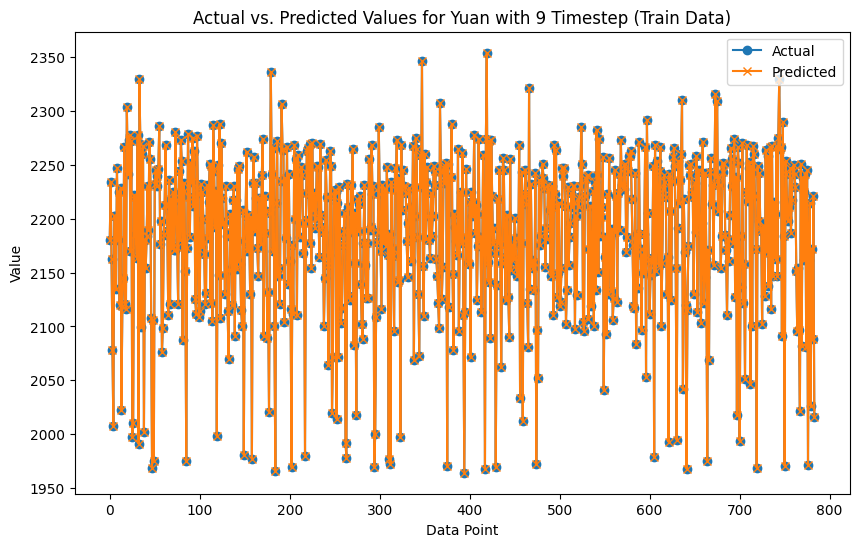

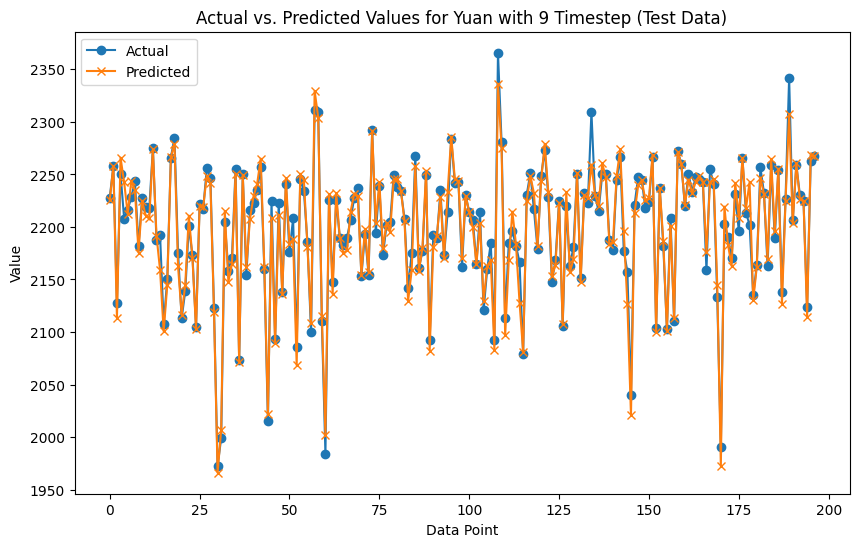

Test results for Yuan with 9 timestep saved to Yuan_test_results_timestep_9.csv


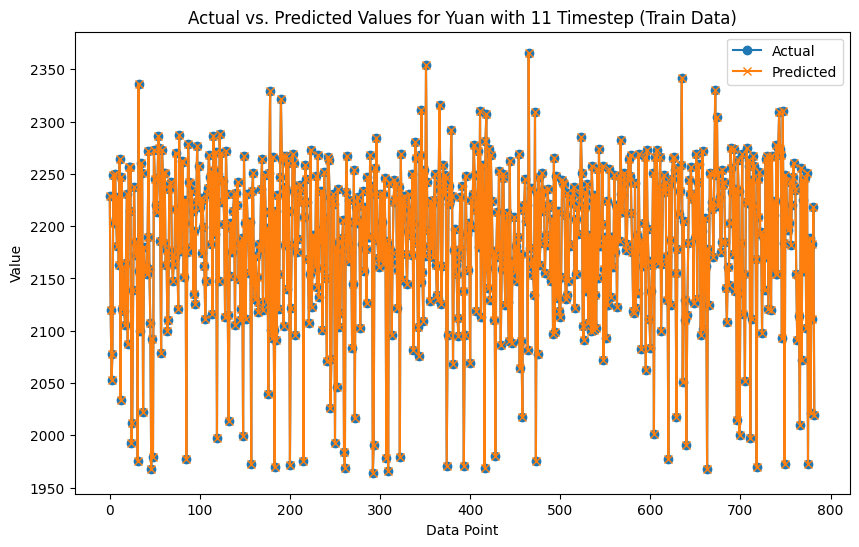

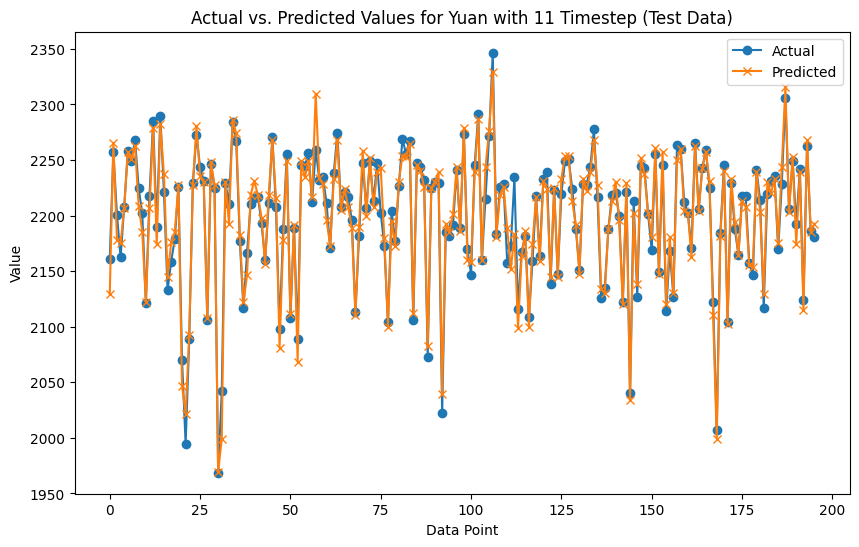

Test results for Yuan with 11 timestep saved to Yuan_test_results_timestep_11.csv


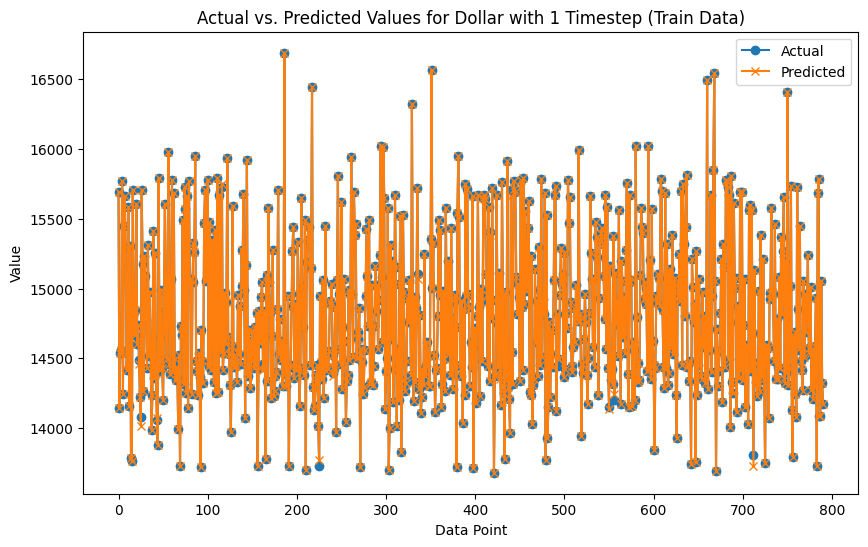

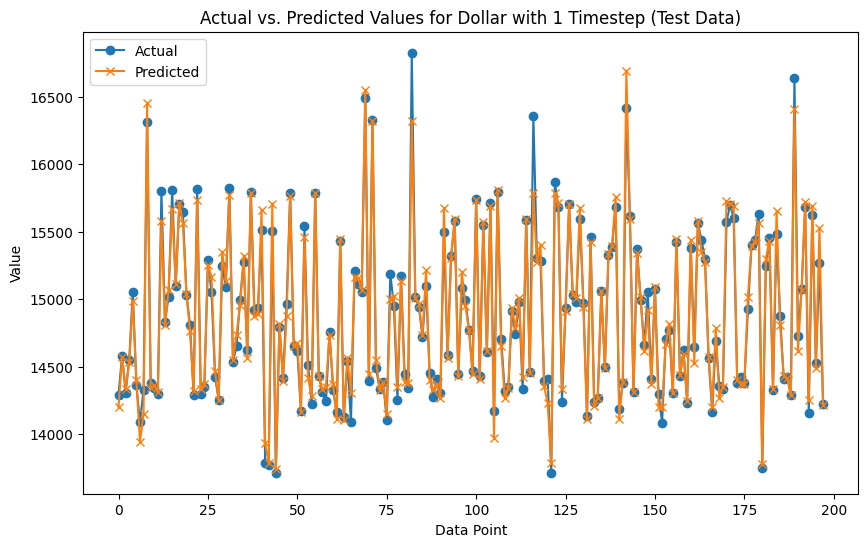

Test results for Dollar with 1 timestep saved to Dollar_test_results_timestep_1.csv


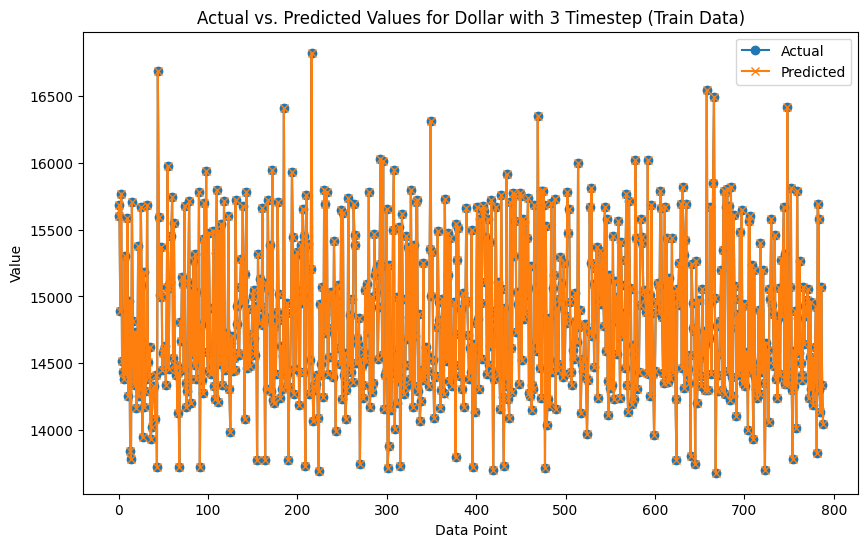

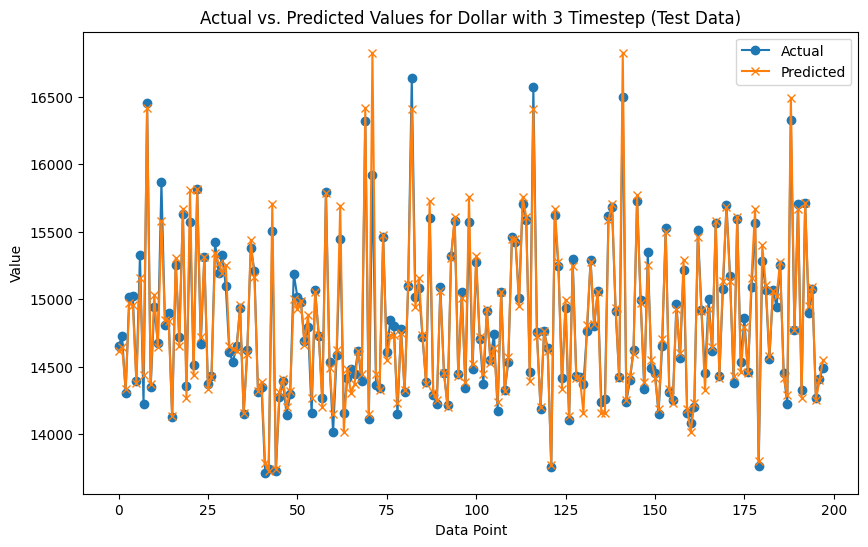

Test results for Dollar with 3 timestep saved to Dollar_test_results_timestep_3.csv


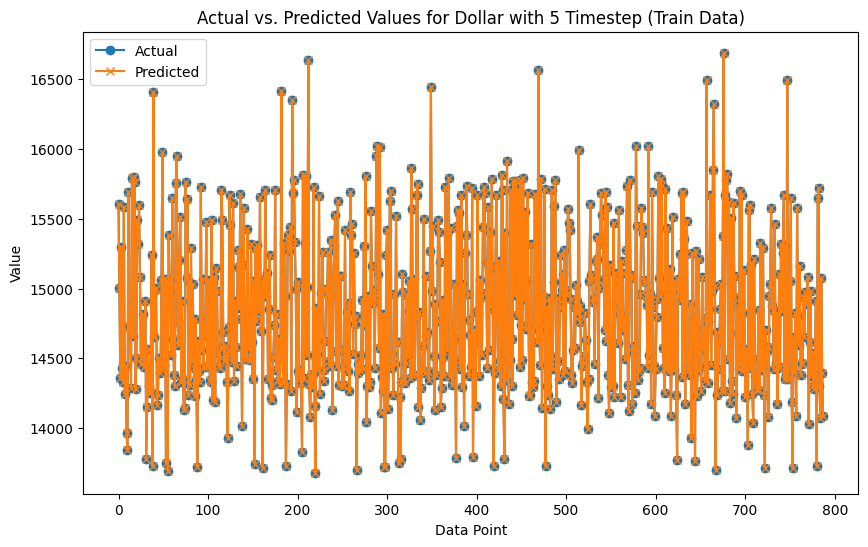

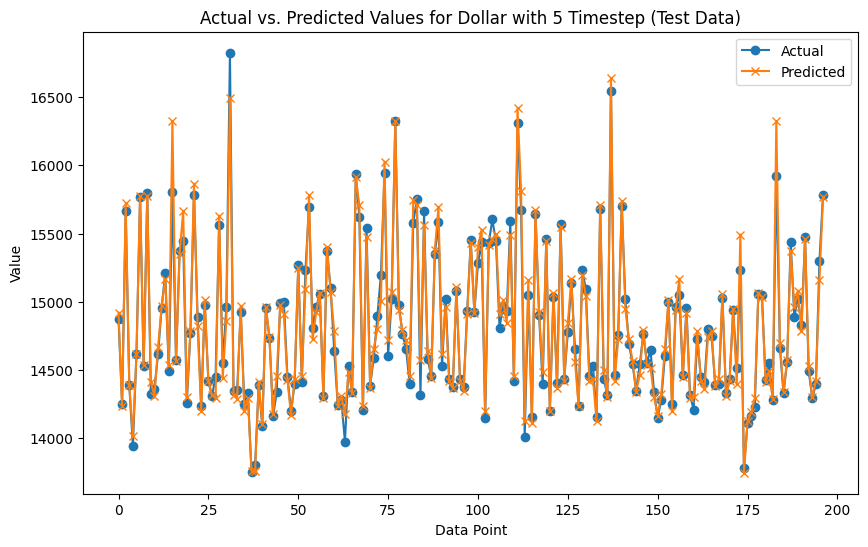

Test results for Dollar with 5 timestep saved to Dollar_test_results_timestep_5.csv


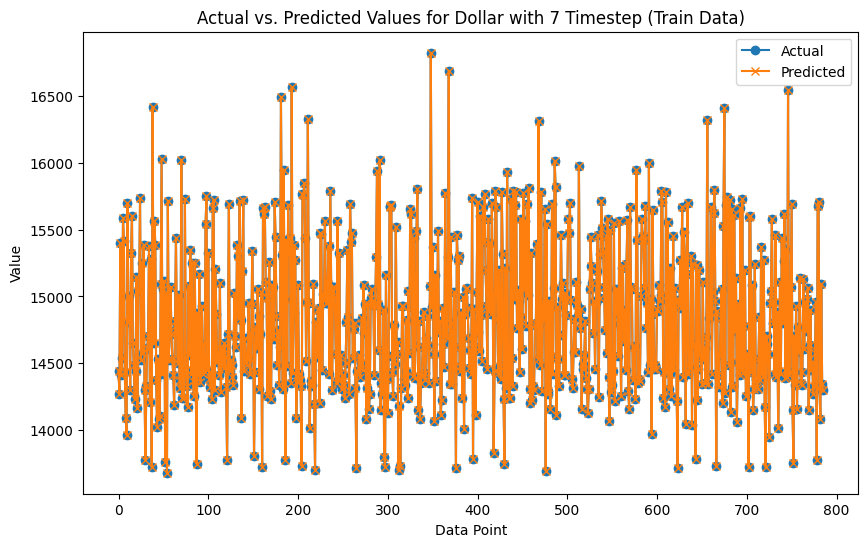

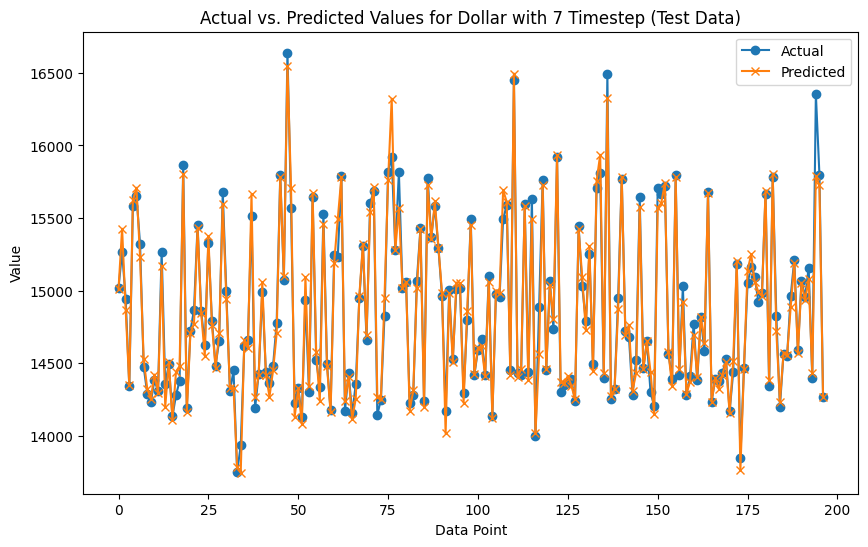

Test results for Dollar with 7 timestep saved to Dollar_test_results_timestep_7.csv


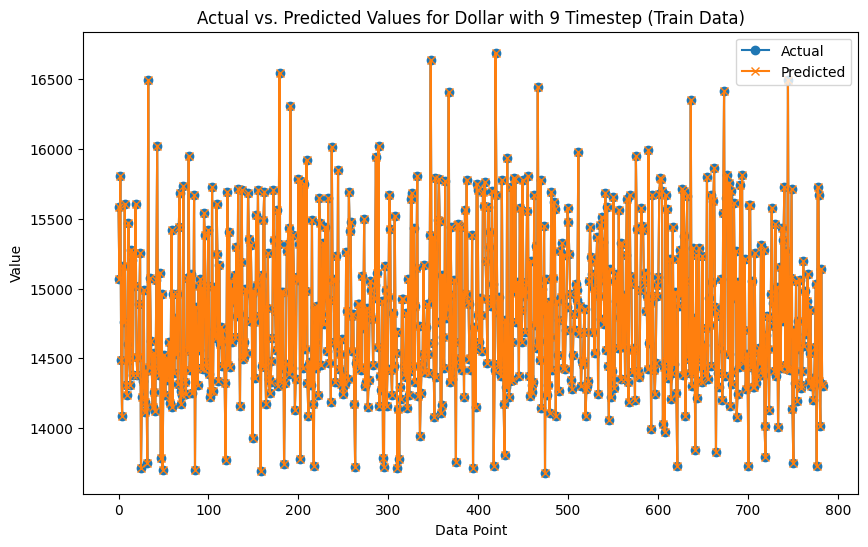

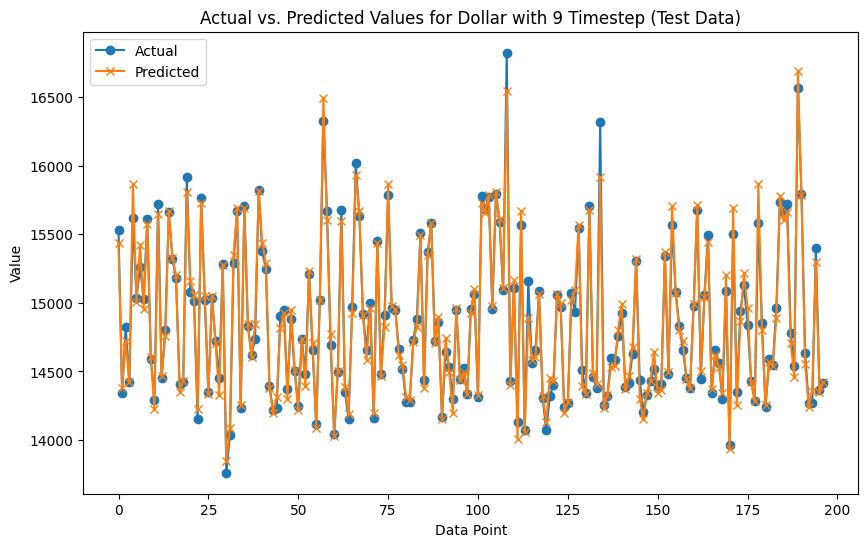

Test results for Dollar with 9 timestep saved to Dollar_test_results_timestep_9.csv


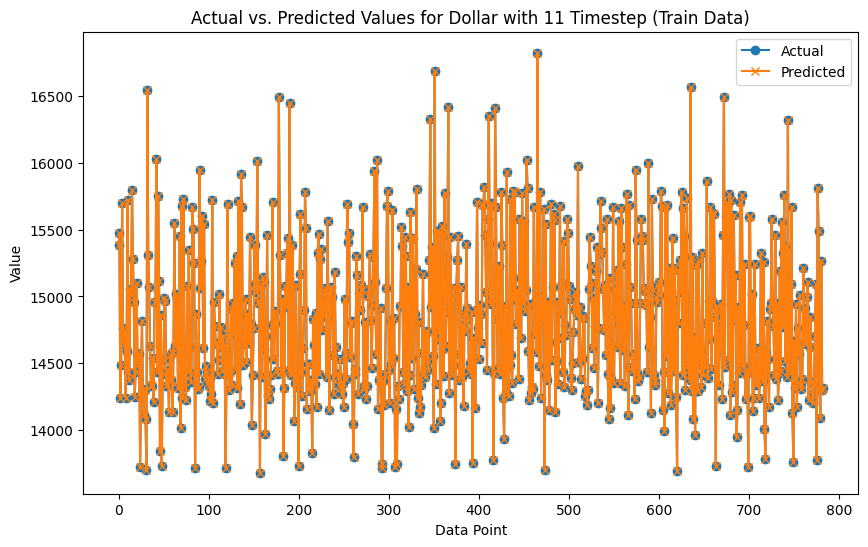

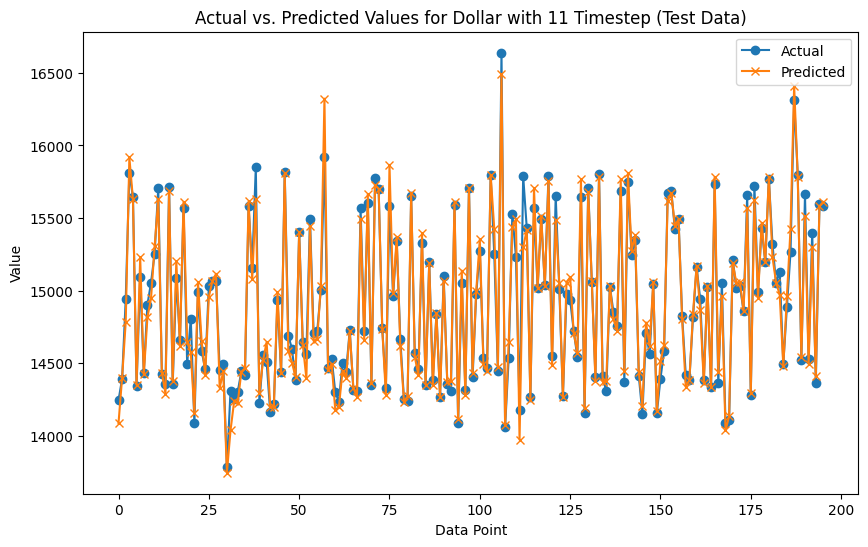

Test results for Dollar with 11 timestep saved to Dollar_test_results_timestep_11.csv
   Dataset  Timestep Data Type        MAE  R-square       Bias      MAPE
0      Yen         1     Train   0.494336  0.999976   0.494336  0.003710
1      Yen         1      Test  81.034394  0.992056  -8.620556  0.650095
2      Yen         3     Train   0.050545  0.999999  -0.050545  0.000359
3      Yen         3      Test  76.813081  0.992552 -22.522778  0.614651
4      Yen         5     Train   0.000000  1.000000   0.000000  0.000000
5      Yen         5      Test  75.214518  0.993121   5.864569  0.609625
6      Yen         7     Train   0.000000  1.000000   0.000000  0.000000
7      Yen         7      Test  70.053401  0.994039  -6.711269  0.570686
8      Yen         9     Train   0.000000  1.000000   0.000000  0.000000
9      Yen         9      Test  64.831624  0.994448 -10.938325  0.523073
10     Yen        11     Train   0.000000  1.000000   0.000000  0.000000
11     Yen        11      Test  69.747

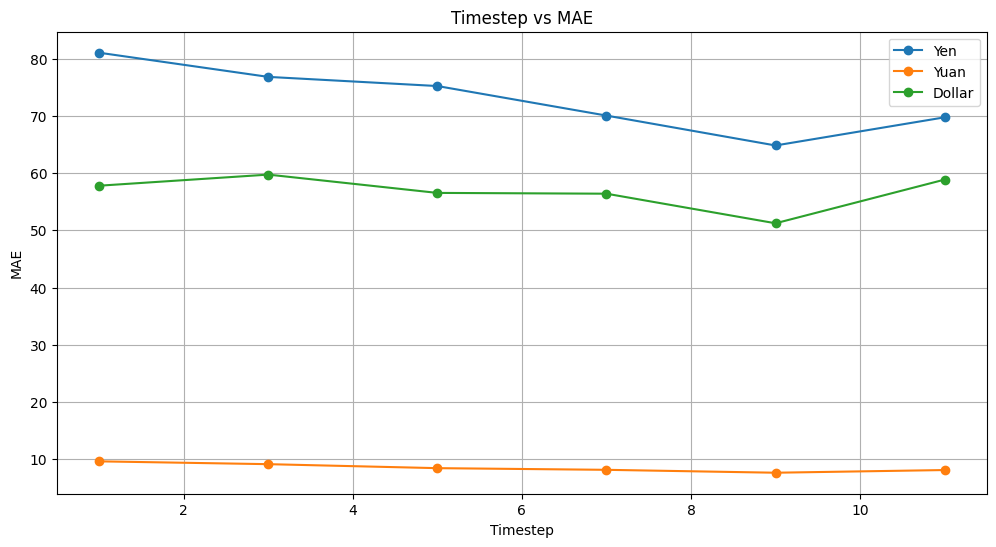

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor

# Fungsi untuk membuat dataset menjadi sequence
def create_sequences(data, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(data)):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        if out_end_ix > len(data):
            break
        seq_x, seq_y = data[i:end_ix, :-1], data[end_ix:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Fungsi untuk visualisasi actual vs predicted
def plot_actual_vs_predicted(y_actual, y_pred, dataset_name, n_steps, data_type):
    plt.figure(figsize=(10, 6))
    plt.plot(y_actual, label='Actual', marker='o')
    plt.plot(y_pred, label='Predicted', marker='x')
    plt.title(f'Actual vs. Predicted Values for {dataset_name} with {n_steps} Timestep ({data_type} Data)')
    plt.xlabel('Data Point')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Fungsi untuk membangun model GRNN
def build_grnn_model():
    return KNeighborsRegressor(n_neighbors=1)

# Contoh data
datasets = {
    'Yen': 'Dataaset Kurs JYP1.csv',
    'Yuan': 'Dataset Kurs CNY.csv',
    'Dollar': 'Dataset Kurs USD1.csv'
}

# Time step options untuk setiap dataset
time_steps_options = [1, 3, 5, 7, 9, 11]

# Menyimpan hasil
results = []

for name, filepath in datasets.items():
    df = pd.read_csv(filepath)
    df['suku_bunga_acuan'] = df['suku_bunga_acuan'].str.replace('%', '').astype(float)
    df['inflasi'] = df['inflasi'].str.replace('%', '').astype(float)
    df['tanggal'] = pd.to_datetime(df['tanggal'])

    # Pisahkan kolom tanggal
    dates = df['tanggal'].values
    data_numeric = df[['suku_bunga_acuan', 'inflasi', 'kurs_beli', 'kurs_jual']].values

    # Lakukan scaling hanya pada data numerik
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data_numeric)

    for n_steps in time_steps_options:
        X, y = create_sequences(data_scaled, n_steps, 1)

        X_train, X_test, y_train, y_test, dates_train, dates_test = train_test_split(X, y, dates[n_steps:], test_size=0.2, random_state=42)

        # Bentuk ulang X_train dan X_test untuk GRNN
        X_train = X_train.reshape(X_train.shape[0], -1)
        X_test = X_test.reshape(X_test.shape[0], -1)

        model = build_grnn_model()
        model.fit(X_train, y_train)

        y_pred_train = model.predict(X_train)
        y_pred_test = model.predict(X_test)

        # Denormalisasi hasil prediksi dan data aktual
        # Tambahkan kolom dummy untuk denormalisasi
        dummy_train = np.zeros((y_train.shape[0], data_numeric.shape[1] - 1))
        dummy_test = np.zeros((y_test.shape[0], data_numeric.shape[1] - 1))

        y_train_combined = np.concatenate((dummy_train, y_train), axis=1)
        y_pred_train_combined = np.concatenate((dummy_train, y_pred_train), axis=1)
        y_test_combined = np.concatenate((dummy_test, y_test), axis=1)
        y_pred_test_combined = np.concatenate((dummy_test, y_pred_test), axis=1)

        # Denormalisasi data
        y_train_denorm = scaler.inverse_transform(y_train_combined)[:, -1]
        y_pred_train_denorm = scaler.inverse_transform(y_pred_train_combined)[:, -1]
        y_test_denorm = scaler.inverse_transform(y_test_combined)[:, -1]
        y_pred_test_denorm = scaler.inverse_transform(y_pred_test_combined)[:, -1]

        # Menghitung metrik evaluasi pada skala asli untuk data training
        mae_train = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
        r2_train = r2_score(y_train_denorm, y_pred_train_denorm)
        bias_train = np.mean(y_pred_train_denorm - y_train_denorm)
        mape_train = np.mean(np.abs((y_train_denorm - y_pred_train_denorm) / y_train_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (training)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Train',
            'MAE': mae_train,
            'R-square': r2_train,
            'Bias': bias_train,
            'MAPE': mape_train
        })

        # Menghitung metrik evaluasi pada skala asli untuk data testing
        mae_test = mean_absolute_error(y_test_denorm, y_pred_test_denorm)
        r2_test = r2_score(y_test_denorm, y_pred_test_denorm)
        bias_test = np.mean(y_pred_test_denorm - y_test_denorm)
        mape_test = np.mean(np.abs((y_test_denorm - y_pred_test_denorm) / y_test_denorm)) * 100

        # Menyimpan hasil untuk timestep saat ini dengan data denormalisasi (testing)
        results.append({
            'Dataset': name,
            'Timestep': n_steps,
            'Data Type': 'Test',
            'MAE': mae_test,
            'R-square': r2_test,
            'Bias': bias_test,
            'MAPE': mape_test
        })

        # Visualisasi actual vs predicted untuk data train dan test
        plot_actual_vs_predicted(y_train_denorm, y_pred_train_denorm, name, n_steps, 'Train')
        plot_actual_vs_predicted(y_test_denorm, y_pred_test_denorm, name, n_steps, 'Test')

        # Membuat DataFrame untuk data actual dan predicted test dengan tanggal
        test_results_df = pd.DataFrame({
            'Date': dates_test,
            'Actual': y_test_denorm,
            'Predicted': y_pred_test_denorm
        })

        # Simpan DataFrame ke file CSV
        test_results_df.to_csv(f'{name}_test_results_timestep_{n_steps}.csv', index=False)

        print(f"Test results for {name} with {n_steps} timestep saved to {name}_test_results_timestep_{n_steps}.csv")

# Menampilkan hasil
results_df = pd.DataFrame(results)
print(results_df)

# Pilih nilai timestep dengan MAE terendah sebagai nilai optimal untuk data test
optimal_timestep = results_df[results_df['Data Type'] == 'Test'].loc[results_df[results_df['Data Type'] == 'Test']['MAE'].idxmin()]['Timestep']
print(f"Optimal Timestep: {optimal_timestep}")

# Plot MAE terhadap timestep untuk setiap dataset
def plot_timestep_vs_metric(results_df, metric):
    plt.figure(figsize=(12, 6))
    for dataset in results_df['Dataset'].unique():
        data = results_df[(results_df['Dataset'] == dataset) & (results_df['Data Type'] == 'Test')]
        plt.plot(data['Timestep'], data[metric], marker='o', label=dataset)

    plt.title(f'Timestep vs {metric}')
    plt.xlabel('Timestep')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot MAE terhadap timestep untuk setiap dataset
plot_timestep_vs_metric(results_df, 'MAE')
